In [1]:
import os
import polars as pl
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
def read_parquet_by_type(train_path: str):
    # Lấy tất cả các file parquet trong thư mục
    files = [os.path.join(train_path, f) for f in os.listdir(train_path) if f.endswith('.parquet')]
    
    # Phân loại các file theo loại tên
    user_chunk_files = [file for file in files if 'user_chunk' in file]
    purchase_history_chunk_files = [file for file in files if 'purchase_history_daily_chunk' in file]
    item_chunk_files = [file for file in files if 'item_chunk' in file]
    
    # Đọc các file riêng biệt thành DataFrame
    user_chunk_df = pl.concat([pl.read_parquet(file) for file in user_chunk_files]) if user_chunk_files else None
    purchase_history_chunk_df = pl.concat([pl.read_parquet(file) for file in purchase_history_chunk_files]) if purchase_history_chunk_files else None
    item_chunk_df = pl.concat([pl.read_parquet(file) for file in item_chunk_files]) if item_chunk_files else None
    
    # Trả về một dictionary chứa các DataFrame
    return {
        "user_chunk": user_chunk_df,
        "purchase_history_chunk": purchase_history_chunk_df,
        "item_chunk": item_chunk_df
    }

In [7]:
train_path = './recommendation_dataset'
dataframes = read_parquet_by_type(train_path)

df_user = dataframes["user_chunk"]
df_purchase = dataframes["purchase_history_chunk"]
df_item = dataframes["item_chunk"]

# Phân Tích Đa Biến

## Purchase Chunk

In [8]:
import polars as pl
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def detect_column_types(df: pl.DataFrame):
    numeric_cols = []
    category_cols = []

    numeric_types = {
        pl.Int8, pl.Int16, pl.Int32, pl.Int64,
        pl.UInt8, pl.UInt16, pl.UInt32, pl.UInt64,
        pl.Float32, pl.Float64, pl.Decimal
    }

    for name, dtype in df.schema.items():
        # Kiểm tra kiểu số
        if dtype in numeric_types or isinstance(dtype, pl.Decimal):
            numeric_cols.append(name)
        # Kiểu chuỗi (categorical)
        elif dtype == pl.Utf8:
            category_cols.append(name)

    return numeric_cols, category_cols

In [9]:
numeric_cols, category_cols = detect_column_types(df_purchase)

In [10]:
print("numeric_cols:", numeric_cols)
print("category_cols:", category_cols)

numeric_cols: ['timestamp', 'event_value', 'price', 'date_key', 'quantity', 'customer_id', 'location', 'discount']
category_cols: ['user_id', 'item_id', 'event_type', 'channel', 'payment']


In [12]:
numeric_cols = ['timestamp','price','date_key','customer_id' ,'location', 'discount']
category_cols = ['item_id','channel', 'payment']

### Numeric-Numeric

#### Statistic
Sử dụng
1. Correlation
2. Regression

In [7]:
import polars as pl
import pandas as pd
import numpy as np
from scipy import stats
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

def perform_multivariate_analysis(df_item, numeric_cols):
    # Giữ lại các cột có tồn tại trong DataFrame
    df_num = df_item.select([pl.col(c).cast(pl.Float64).alias(c) for c in numeric_cols if c in df_item.columns])

    # Chuyển sang pandas và loại bỏ giá trị null
    df_num_pd = df_num.to_pandas().dropna()

    if df_num_pd.shape[0] < 2:
        print("⚠️ Không đủ dữ liệu để phân tích.")
        return

    # ==================================================
    # 1️⃣ TƯƠNG QUAN (CORRELATION)
    # ==================================================
    for i in range(len(numeric_cols)):
        for j in range(i + 1, len(numeric_cols)):  # Tính toán cho các cặp cột khác nhau
            col_x = numeric_cols[i]
            col_y = numeric_cols[j]

            pearson_corr, pearson_p = stats.pearsonr(df_num_pd[col_x], df_num_pd[col_y])
            spearman_corr, spearman_p = stats.spearmanr(df_num_pd[col_x], df_num_pd[col_y])
            kendall_corr, kendall_p = stats.kendalltau(df_num_pd[col_x], df_num_pd[col_y])

            print(f"=== 📊 CORRELATION ANALYSIS between {col_x} and {col_y} ===")
            print(f"Pearson  r = {pearson_corr:.4f} (p={pearson_p:.4e})")
            print(f"Spearman r = {spearman_corr:.4f} (p={spearman_p:.4e})")
            print(f"Kendall  τ = {kendall_corr:.4f} (p={kendall_p:.4e})")

            # Nhận xét nhanh về tương quan
            def interpret_corr(r):
                r_abs = abs(r)
                if r_abs < 0.1:
                    return "Không có tương quan"
                elif r_abs < 0.3:
                    return "Tương quan yếu"
                elif r_abs < 0.5:
                    return "Tương quan vừa"
                elif r_abs < 0.7:
                    return "Tương quan mạnh"
                else:
                    return "Tương quan rất mạnh"

            print(f"🔹 Đánh giá: {interpret_corr(pearson_corr)} giữa {col_x} và {col_y}\n")

    # ==================================================
    # 2️⃣ HỒI QUY TUYẾN TÍNH (LINEAR REGRESSION)
    # ==================================================
    for i in range(len(numeric_cols)):
        for j in range(i + 1, len(numeric_cols)):  # Tính toán cho các cặp cột khác nhau
            col_x = numeric_cols[i]
            col_y = numeric_cols[j]

            X = df_num_pd[[col_x]].values
            y = df_num_pd[col_y].values

            model = LinearRegression()
            model.fit(X, y)

            y_pred = model.predict(X)

            # Hệ số hồi quy
            coef = model.coef_[0]
            intercept = model.intercept_
            r2 = r2_score(y, y_pred)
            mae = mean_absolute_error(y, y_pred)
            rmse = np.sqrt(mean_squared_error(y, y_pred))

            print(f"=== 📈 LINEAR REGRESSION ANALYSIS between {col_x} and {col_y} ===")
            print(f"Phương trình: {col_y} = {coef:.4f} * {col_x} + {intercept:.4f}")
            print(f"R² (Explained variance): {r2:.4f}")
            print(f"MAE: {mae:.4f}")
            print(f"RMSE: {rmse:.4f}")

            # Diễn giải
            direction = "tăng" if coef > 0 else "giảm"
            print(f"🔹 Khi {col_x} tăng 1 đơn vị, {col_y} trung bình {direction} {abs(coef):.4f} đơn vị.\n")


In [8]:
perform_multivariate_analysis(df_purchase, numeric_cols)

=== 📊 CORRELATION ANALYSIS between timestamp and event_value ===
Pearson  r = 0.0131 (p=0.0000e+00)
Spearman r = 0.0151 (p=0.0000e+00)
Kendall  τ = 0.0121 (p=0.0000e+00)
🔹 Đánh giá: Không có tương quan giữa timestamp và event_value

=== 📊 CORRELATION ANALYSIS between timestamp and price ===
Pearson  r = -0.0024 (p=3.5091e-47)
Spearman r = -0.0085 (p=0.0000e+00)
Kendall  τ = -0.0057 (p=0.0000e+00)
🔹 Đánh giá: Không có tương quan giữa timestamp và price

=== 📊 CORRELATION ANALYSIS between timestamp and date_key ===
Pearson  r = 0.9983 (p=0.0000e+00)
Spearman r = 1.0000 (p=0.0000e+00)
Kendall  τ = 0.9986 (p=0.0000e+00)
🔹 Đánh giá: Tương quan rất mạnh giữa timestamp và date_key

=== 📊 CORRELATION ANALYSIS between timestamp and quantity ===
Pearson  r = 0.0131 (p=0.0000e+00)
Spearman r = 0.0151 (p=0.0000e+00)
Kendall  τ = 0.0121 (p=0.0000e+00)
🔹 Đánh giá: Không có tương quan giữa timestamp và quantity

=== 📊 CORRELATION ANALYSIS between timestamp and customer_id ===
Pearson  r = 0.0946 (p=0

#### Visualize 
Sử dụng:
1. Scatter plot
2. Pair plot
3. Correlation matrix

In [9]:
import polars as pl
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ============================================
# MULTIVARIATE ANALYSIS — PRICE vs GP
# ============================================

def plot_multivariate_analysis(df_item, numeric_cols):
    # Giữ lại các cột số có tồn tại trong DataFrame
    df_num = df_item.select([pl.col(c).cast(pl.Float64).alias(c) for c in numeric_cols if c in df_item.columns])

    # Chuyển sang pandas và loại bỏ giá trị null
    df_num_pd = df_num.to_pandas().dropna()

    if df_num_pd.shape[0] < 2:
        print("⚠️ Không đủ dữ liệu để phân tích.")
        return

    # --- (1) Scatter plot ---
    plt.figure(figsize=(6, 4))
    for i in range(len(numeric_cols)):
        for j in range(i + 1, len(numeric_cols)):  # Tính toán cho các cặp cột khác nhau
            col_x = numeric_cols[i]
            col_y = numeric_cols[j]

            sns.scatterplot(data=df_num_pd, x=col_x, y=col_y, alpha=0.5)
            sns.regplot(data=df_num_pd, x=col_x, y=col_y, scatter=False, color="red", ci=None)
            plt.title(f"Scatter plot: {col_x} vs {col_y}")
            plt.tight_layout()
            plt.show()

    # --- (2) Pair plot ---
    sns.pairplot(df_num_pd, diag_kind="kde", corner=True)
    plt.suptitle(f"Pair Plot: {', '.join(numeric_cols)}", y=1.02)
    plt.show()

    # --- (3) Correlation matrix ---
    corr = df_num_pd.corr(numeric_only=True)
    print("\nCorrelation matrix:")
    print(corr)

    plt.figure(figsize=(4, 3))
    sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f", vmin=-1, vmax=1)
    plt.title(f"Correlation heatmap: {', '.join(numeric_cols)}")
    plt.tight_layout()
    plt.show()



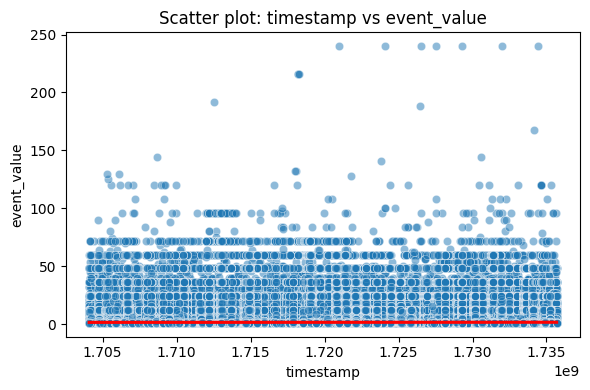

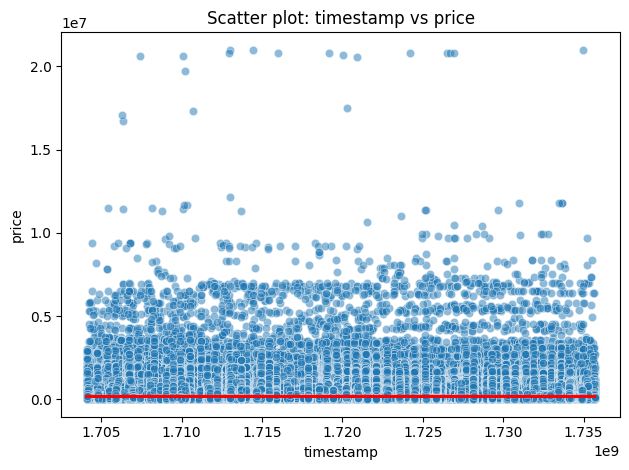

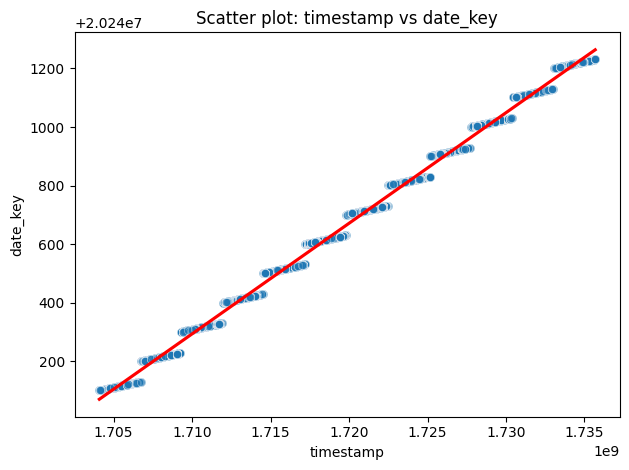

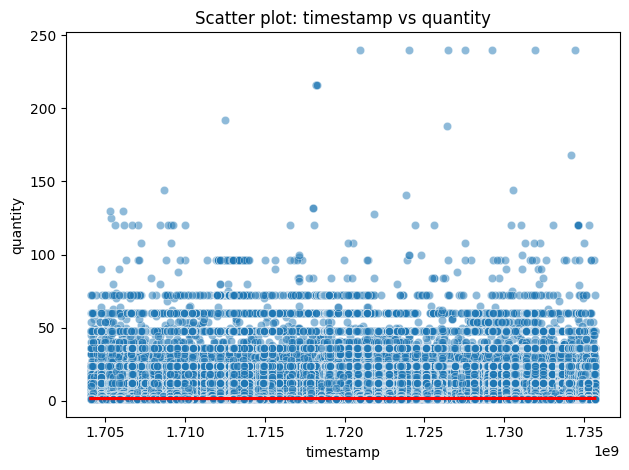

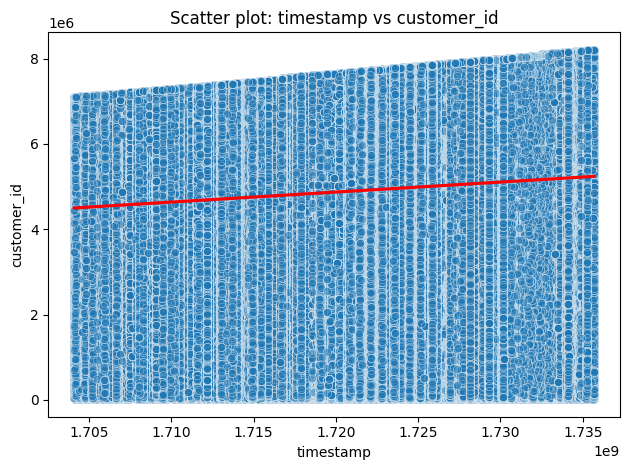

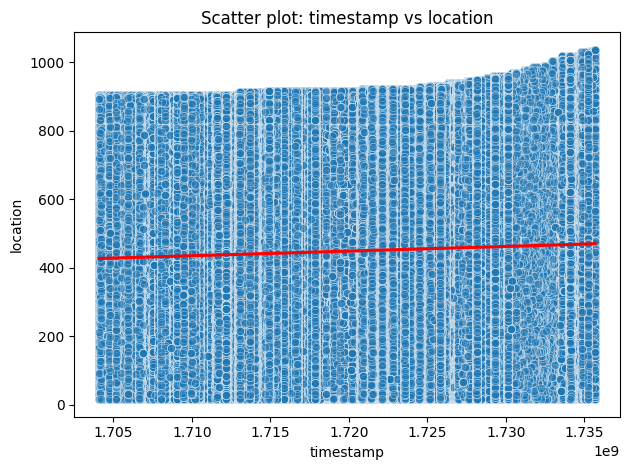

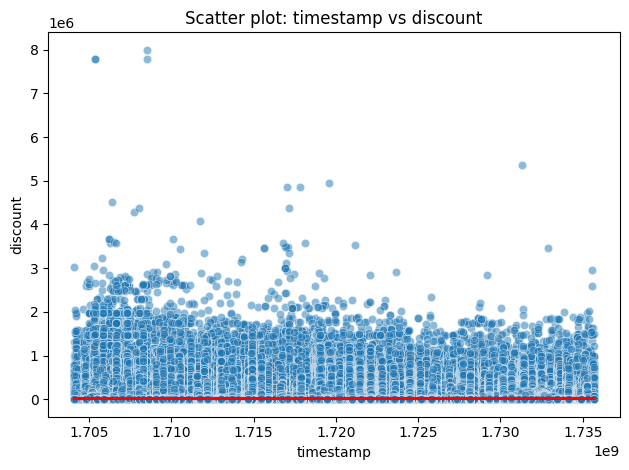

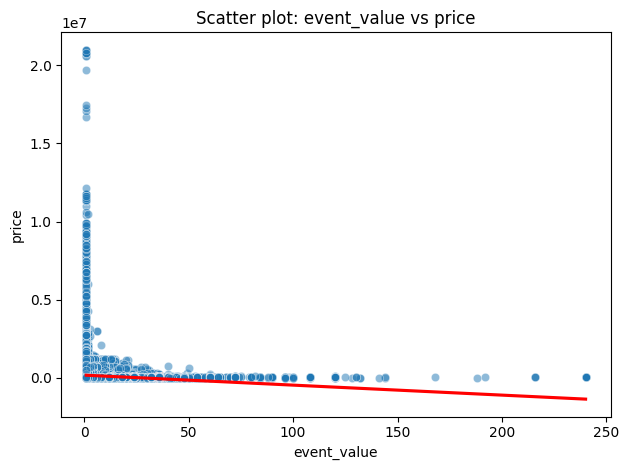

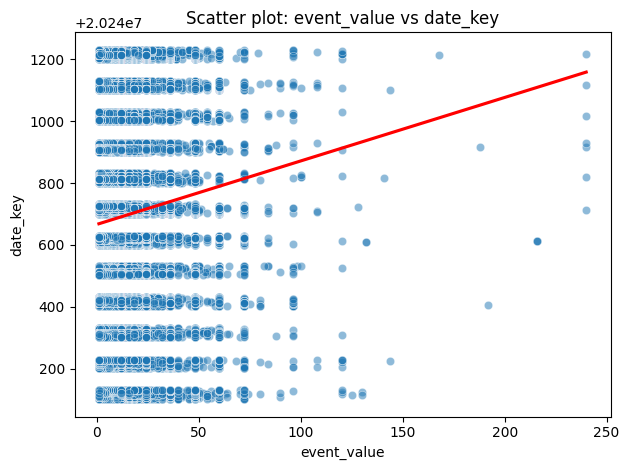

In [ ]:
plot_multivariate_analysis(df_purchase, numeric_cols)

### Numeric-Category

#### Statistic

In [16]:
def analyze_numeric_category(df_item, cat_col, num_col, top_k=8):
    """
    Phân tích thống kê giữa 1 biến định tính (category_col)
    và 1 biến định lượng (numeric_col).
    Gồm:
        - ANOVA
        - Kruskal–Wallis
        - Thống kê mô tả nhóm
    """
    # Chuẩn bị dữ liệu
    df_plot = (
        df_item
        .with_columns([
            pl.col(num_col).cast(pl.Float64),
            pl.col(cat_col).cast(pl.Utf8)
        ])
        .drop_nulls([num_col, cat_col])
    )

    df_pd = df_plot.to_pandas()

    if df_pd.empty:
        print(f"[⚠️] Không có dữ liệu hợp lệ cho ({cat_col}, {num_col})")
        return

    # Lấy top K nhóm phổ biến
    top_cats = df_pd[cat_col].value_counts().nlargest(top_k).index
    df_top = df_pd[df_pd[cat_col].isin(top_cats)]

    # ===============================
    # 1️⃣ Thống kê mô tả theo nhóm
    # ===============================
    summary = (
        df_top.groupby(cat_col)[num_col]
        .agg(['count', 'mean', 'std', 'median', 'min', 'max'])
    )
    summary['iqr'] = (
        df_top.groupby(cat_col)[num_col].quantile(0.75)
        - df_top.groupby(cat_col)[num_col].quantile(0.25)
    )
    print(f"\n📊 Summary Statistics for ({num_col} by {cat_col}):\n", summary)

    # ===============================
    # 2️⃣ ANOVA (One-way)
    # ===============================
    groups = [group[num_col].values for _, group in df_top.groupby(cat_col)]
    p_val = np.nan
    kw_p = np.nan

    try:
        f_stat, p_val = stats.f_oneway(*groups)
        print(f"\n🔹 ANOVA: F = {f_stat:.3f}, p = {p_val:.3e}")
    except Exception as e:
        print(f"[⚠️] ANOVA không thực hiện được: {e}")

    # ===============================
    # 3️⃣ Kruskal–Wallis (phi tham số)
    # ===============================
    try:
        kw_stat, kw_p = stats.kruskal(*groups)
        print(f"🔹 Kruskal–Wallis: H = {kw_stat:.3f}, p = {kw_p:.3e}")
    except Exception as e:
        print(f"[⚠️] Kruskal–Wallis không thực hiện được: {e}")

    # ===============================
    # 4️⃣ So sánh phân phối nhóm
    # ===============================
    group_means = summary['mean']
    print("\n🔹 Group Means:")
    print(group_means.sort_values(ascending=False))

    print("\n➡️ Kết luận:")
    if (not np.isnan(p_val) and p_val < 0.05) or (not np.isnan(kw_p) and kw_p < 0.05):
        print(f"→ Có sự khác biệt có ý nghĩa thống kê giữa các nhóm của {cat_col} về {num_col}")
    else:
        print(f"→ Không có sự khác biệt đáng kể giữa các nhóm của {cat_col} về {num_col}")

# ===================================================
# 🔹 Gọi hàm cho toàn bộ cặp numeric–category
# ===================================================

print("🔢 Numeric columns:", numeric_cols)
print("🏷️ Category columns:", category_cols)
for cat_col in category_cols:
    for num_col in numeric_cols:
        print(f"\n📊 Phân tích cho cặp: ({cat_col}, {num_col})")
        analyze_numeric_category(df_purchase, cat_col, num_col)

🔢 Numeric columns: ['timestamp', 'price', 'date_key', 'customer_id', 'location', 'discount']
🏷️ Category columns: ['item_id', 'channel', 'payment']

📊 Phân tích cho cặp: (item_id, timestamp)

📊 Summary Statistics for (timestamp by item_id):
                 count          mean           std        median           min  \
item_id                                                                         
0020010000438  206507  1.718362e+09  8.955870e+06  1.717841e+09  1.704094e+09   
1512000000004  302740  1.719002e+09  9.586488e+06  1.720344e+09  1.704093e+09   
2803000000011  185810  1.718982e+09  9.077055e+06  1.718220e+09  1.704094e+09   
2803000000013  224091  1.719207e+09  9.082766e+06  1.718568e+09  1.704092e+09   
3773000000004  156513  1.720777e+09  8.868426e+06  1.721560e+09  1.704094e+09   
4690000000001  197920  1.726251e+09  6.362319e+06  1.726993e+09  1.713268e+09   
5950000000001  179824  1.719167e+09  9.087519e+06  1.718733e+09  1.704094e+09   
6768000000005  157294  1.7205

#### Visualize
Sử dụng:
1. Multiple density / histogram
2. Box-plot

In [ ]:


def plot_numeric_category(df_item, cat_col, num_col, top_k=8):
    """
    Vẽ các biểu đồ Density, Histogram, Box Plot cho 1 cặp (category_col, numeric_col).
    """
    # --- Chuẩn bị dữ liệu ---
    df_plot = (
        df_item
        .with_columns([
            pl.col(num_col).cast(pl.Float64),
            pl.col(cat_col).cast(pl.Utf8)
        ])
        .drop_nulls([num_col, cat_col])
    )

    df_pd = df_plot.to_pandas()

    # Nếu dữ liệu trống thì bỏ qua
    if df_pd.empty:
        print(f"[⚠️] Không có dữ liệu hợp lệ cho ({cat_col}, {num_col})")
        return

    # Lấy top category phổ biến nhất
    top_cats = df_pd[cat_col].value_counts().nlargest(top_k).index
    df_top = df_pd[df_pd[cat_col].isin(top_cats)]
    df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
    sns.set(style="whitegrid", font_scale=1.1)
    palette = sns.color_palette(n_colors=len(top_cats))


    # ===============================
    # 1️⃣ DENSITY PLOT
    # ===============================
    plt.figure(figsize=(10, 6))
    ax = sns.kdeplot(
        data=df_top,
        x=num_col,
        hue=cat_col,
        common_norm=False,
        fill=True,
        alpha=0.4,
        palette=palette
    )
    ax.set_title(f"Density Plot — {num_col} by {cat_col}", fontsize=14)
    ax.set_xlabel(num_col)
    ax.set_ylabel("Density")

    handles = [plt.Rectangle((0, 0), 1, 1, color=color) for color in palette]
    labels = list(top_cats)
    plt.legend(handles, labels, title=cat_col, bbox_to_anchor=(1.02, 1), loc="upper left", frameon=True)
    plt.tight_layout()
    plt.show()

    # ===============================
    # 2️⃣ HISTOGRAM
    # ===============================
    plt.figure(figsize=(10, 6))
    ax = sns.histplot(
        data=df_top,
        x=num_col,
        hue=cat_col,
        element="step",
        stat="density",
        common_norm=False,
        bins=40,
        alpha=0.5,
        palette=palette
    )
    ax.set_title(f"Histogram — {num_col} by {cat_col}", fontsize=14)
    ax.set_xlabel(num_col)
    ax.set_ylabel("Density")

    plt.legend(handles, labels, title=cat_col, bbox_to_anchor=(1.02, 1), loc="upper left", frameon=True)
    plt.tight_layout()
    plt.show()

    # ===============================
    # 3️⃣ BOX PLOT
    # ===============================
    plt.figure(figsize=(12, 6))
    ax = sns.boxplot(
        data=df_top,
        x=cat_col,
        y=num_col,
        palette=palette,
        showfliers=False
    )
    ax.set_title(f"Box Plot — {num_col} by {cat_col}", fontsize=14)
    ax.set_xlabel(cat_col)
    ax.set_ylabel(num_col)
    plt.xticks(rotation=45, ha='right')

    plt.legend(handles, labels, title=cat_col, bbox_to_anchor=(1.02, 1), loc="upper left", frameon=True)
    plt.tight_layout()
    plt.show()

def truncate_label(s, max_len=10):
    """Truncate string s to max_len chars, add '...' if truncated"""
    if s is None:
        return ""
    s = str(s)
    return s if len(s) <= max_len else s[:max_len-3] + "..."

🔢 Numeric columns: ['timestamp', 'event_value', 'price', 'date_key', 'quantity', 'customer_id', 'location', 'discount']
🏷️ Category columns: ['user_id', 'item_id', 'event_type', 'channel', 'payment']

📊 Vẽ biểu đồ cho cặp: (user_id, timestamp)


/tmp/ipykernel_4158223/4165398934.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


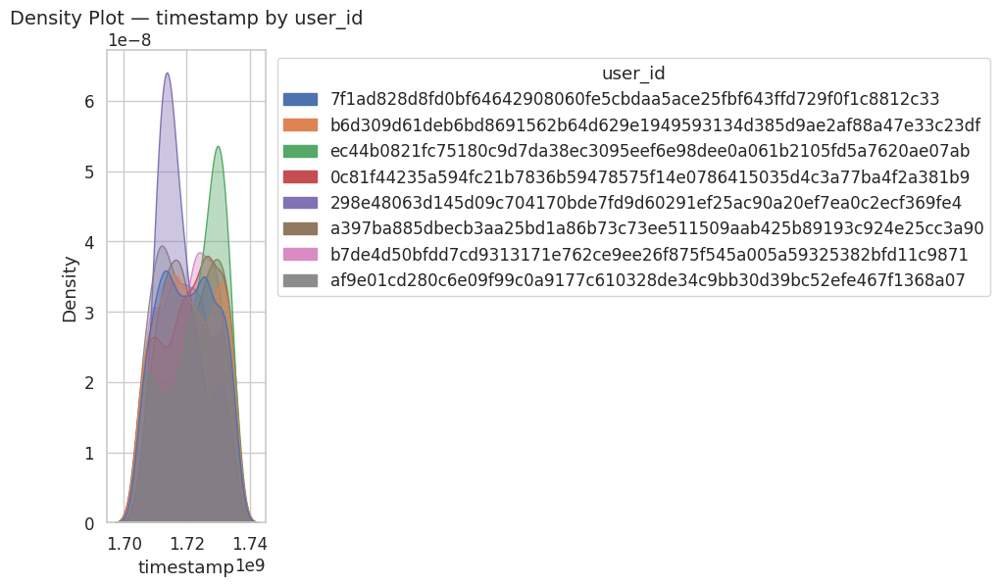

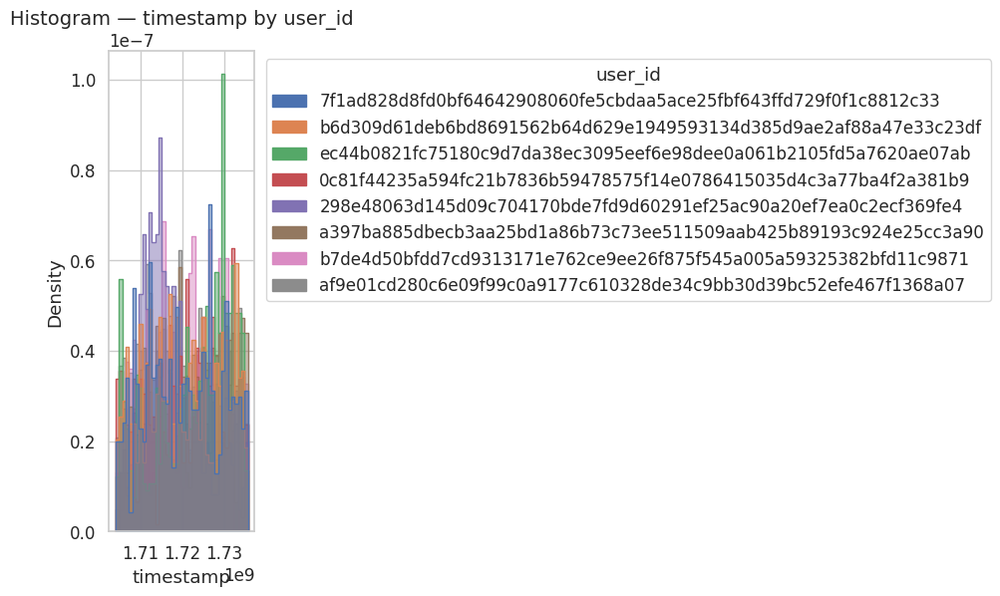

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


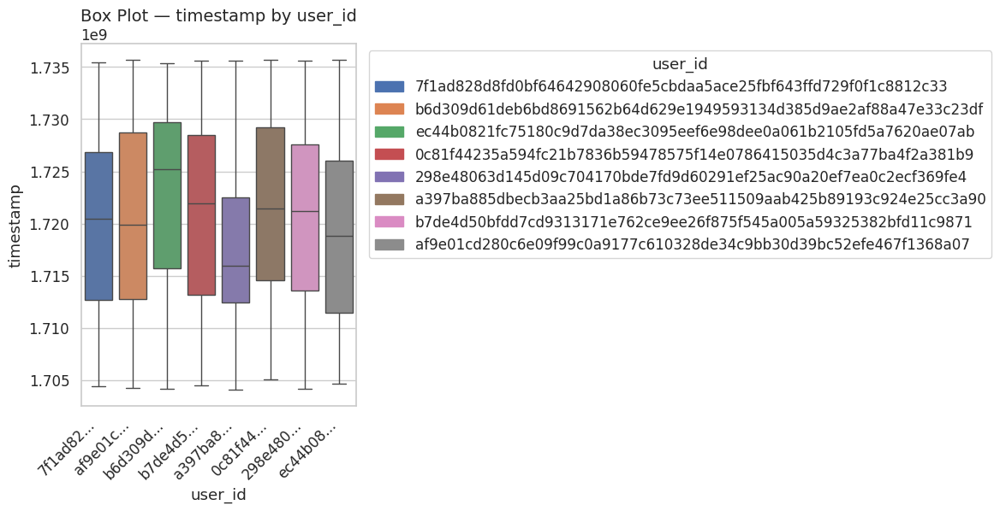


📊 Vẽ biểu đồ cho cặp: (user_id, event_value)


/tmp/ipykernel_4158223/4165398934.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


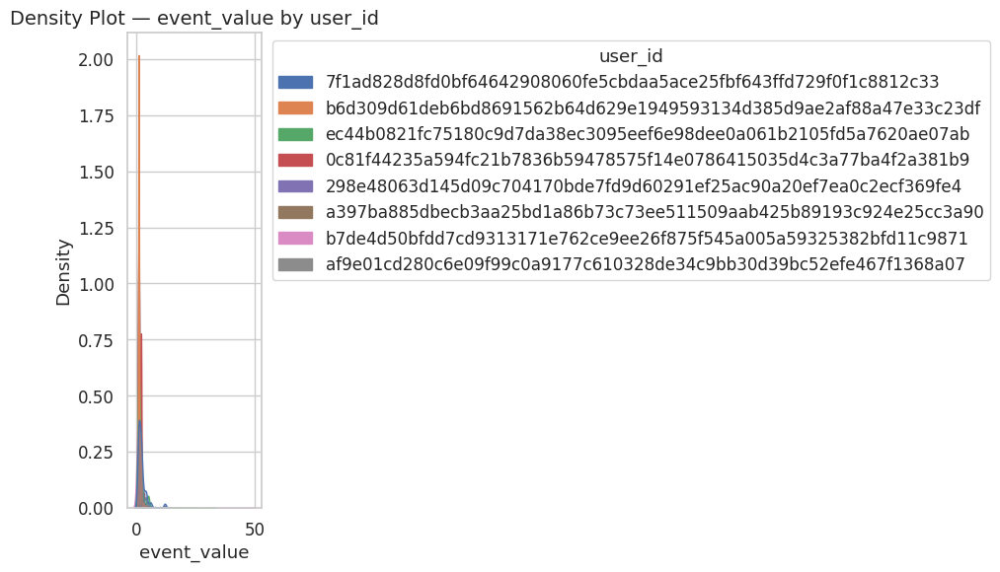

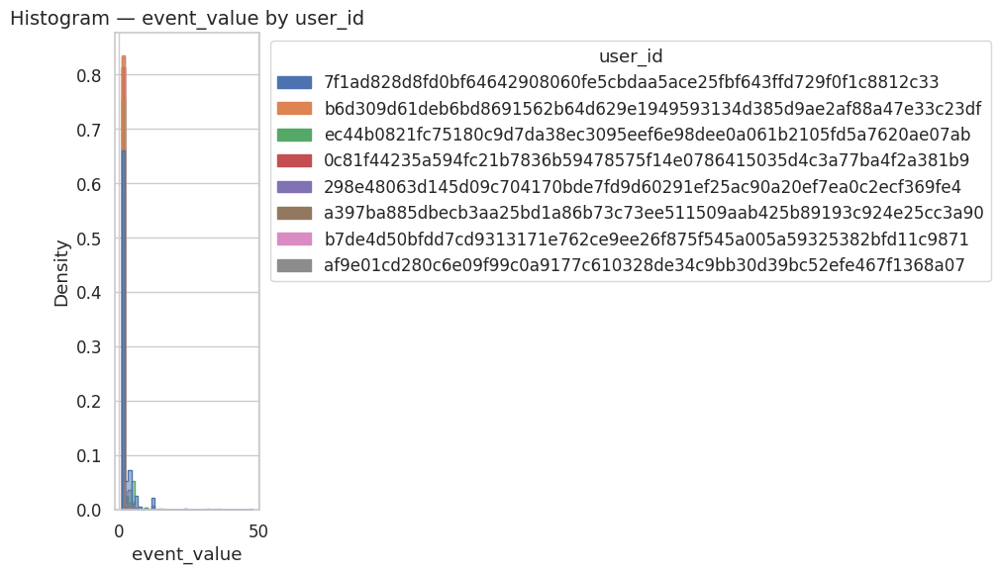

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


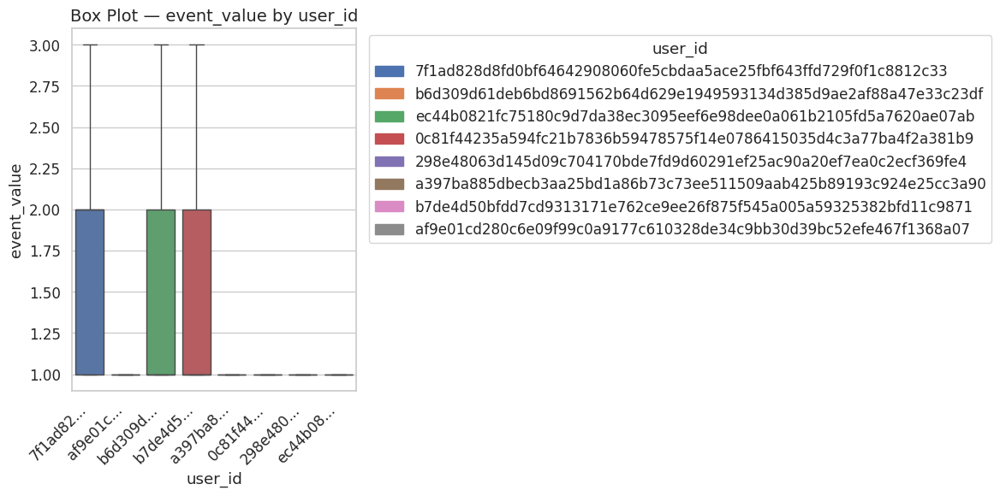


📊 Vẽ biểu đồ cho cặp: (user_id, price)


/tmp/ipykernel_4158223/4165398934.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


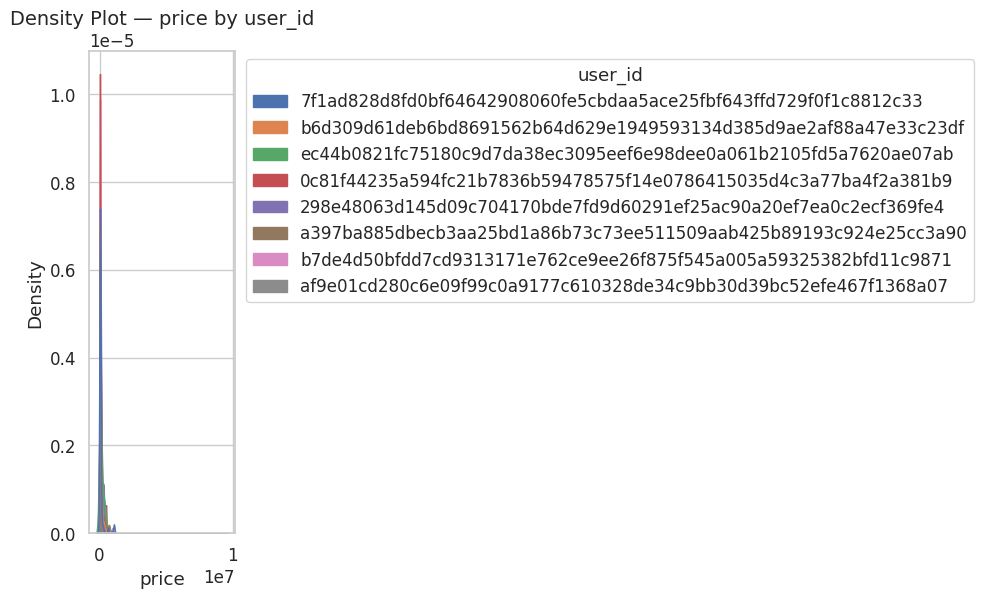

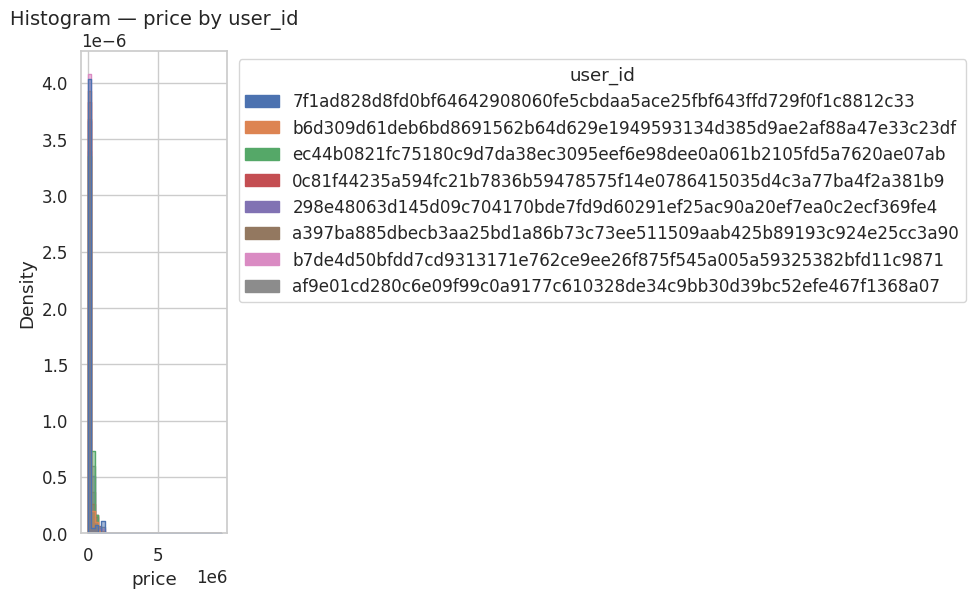

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


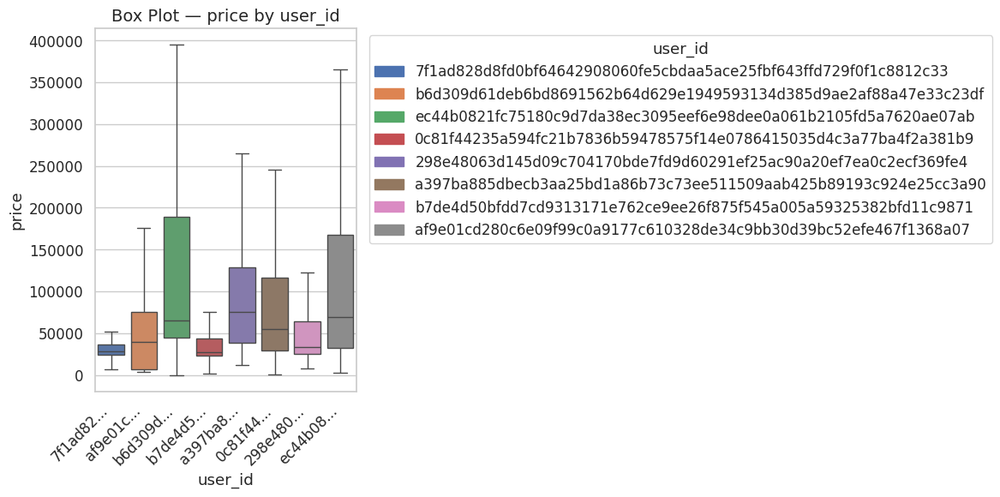


📊 Vẽ biểu đồ cho cặp: (user_id, date_key)


/tmp/ipykernel_4158223/4165398934.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


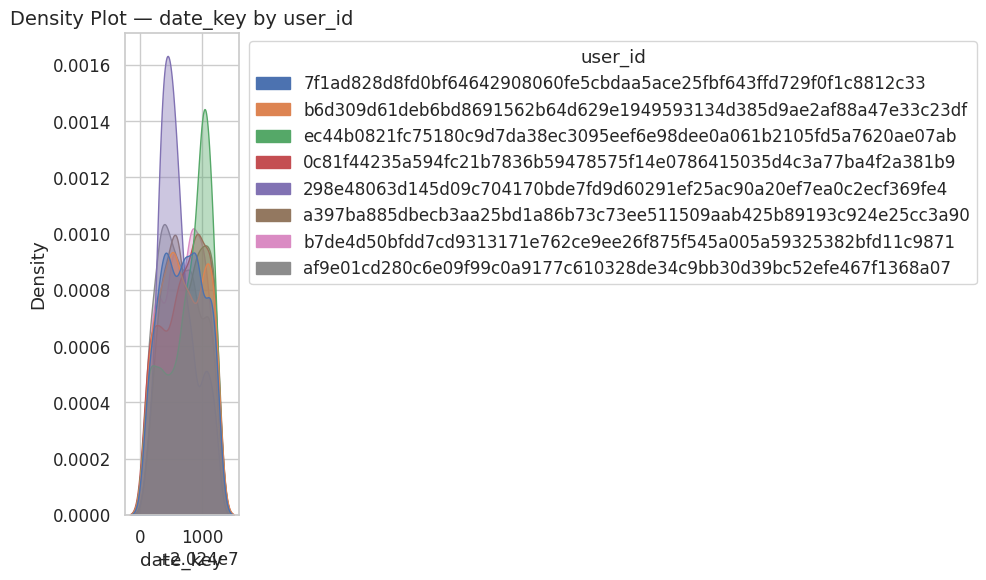

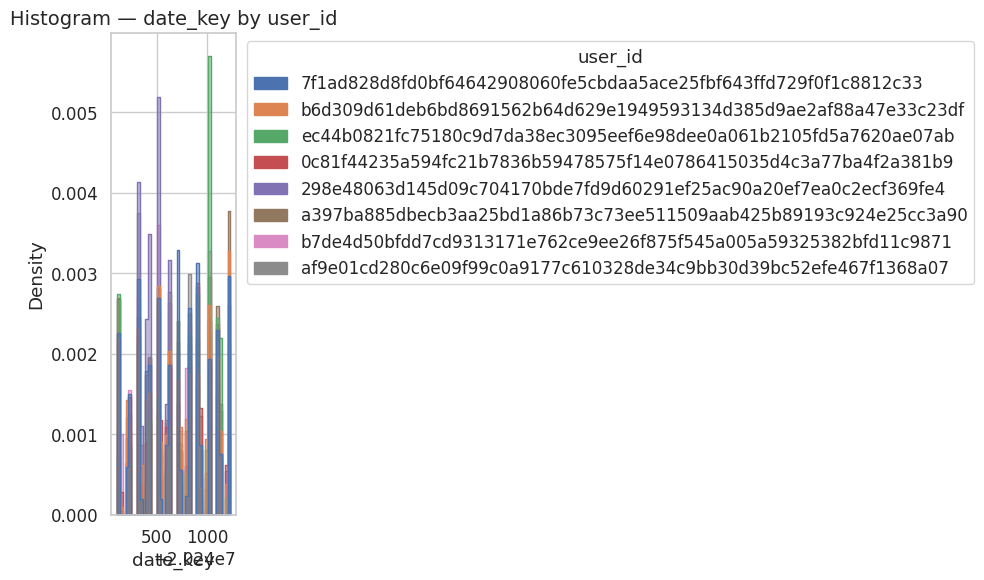

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


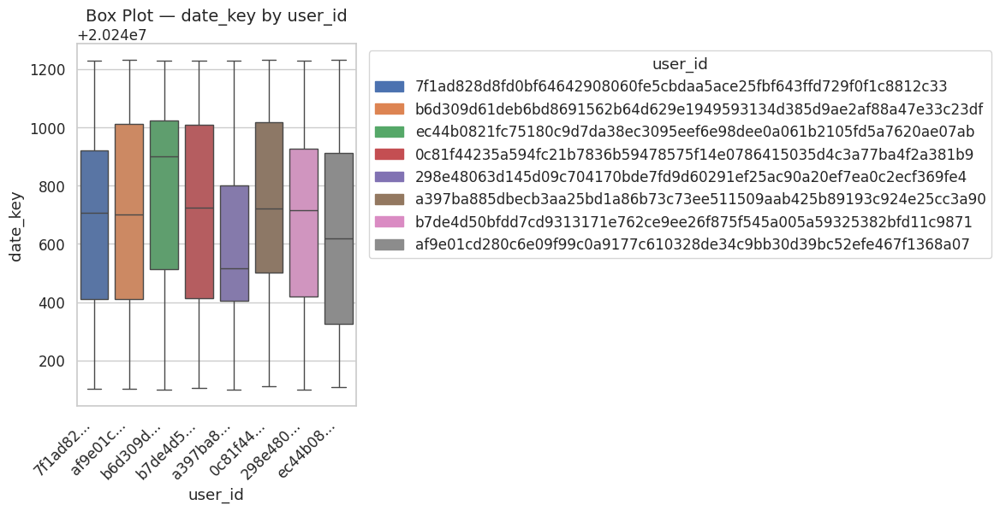


📊 Vẽ biểu đồ cho cặp: (user_id, quantity)


/tmp/ipykernel_4158223/4165398934.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


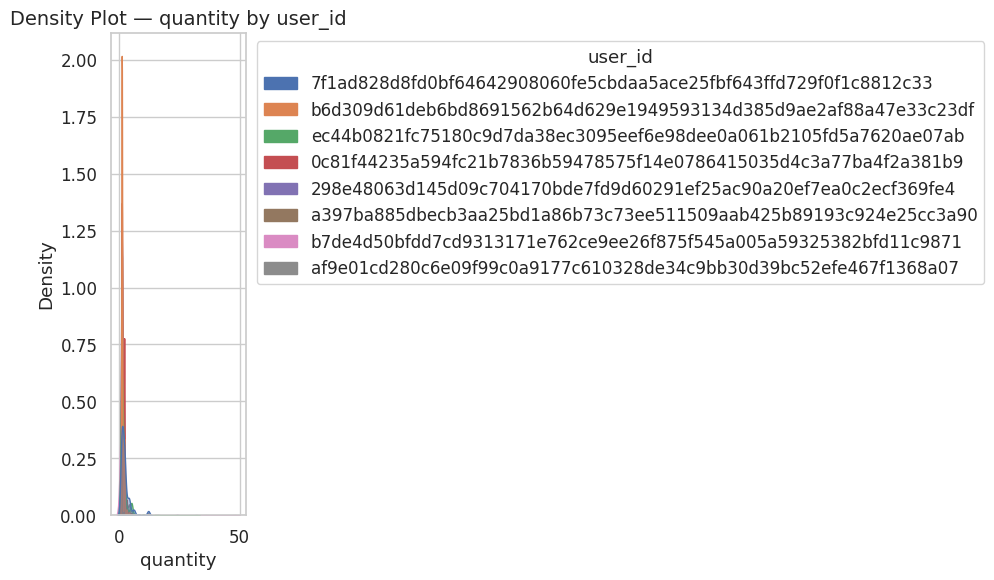

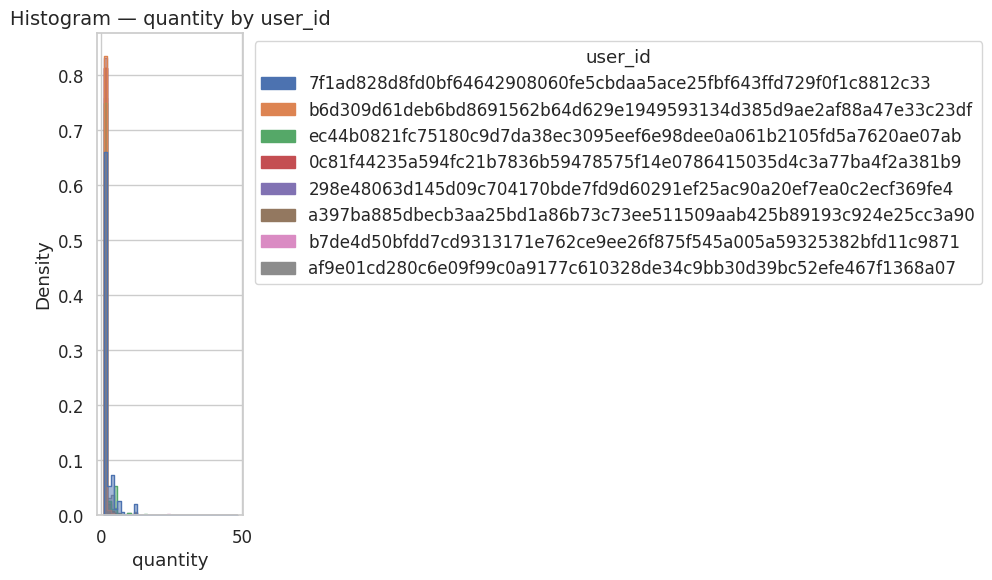

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


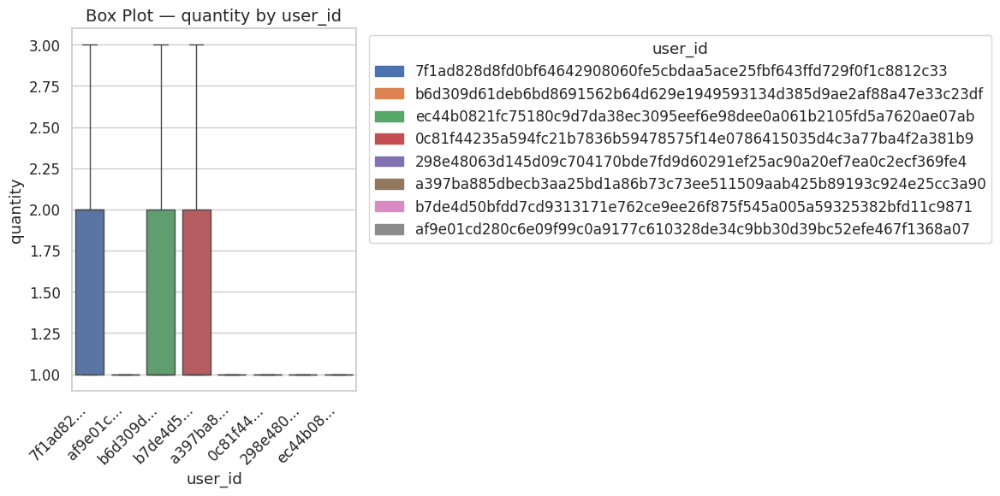


📊 Vẽ biểu đồ cho cặp: (user_id, customer_id)


/tmp/ipykernel_4158223/4165398934.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_4158223/4165398934.py:59: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(


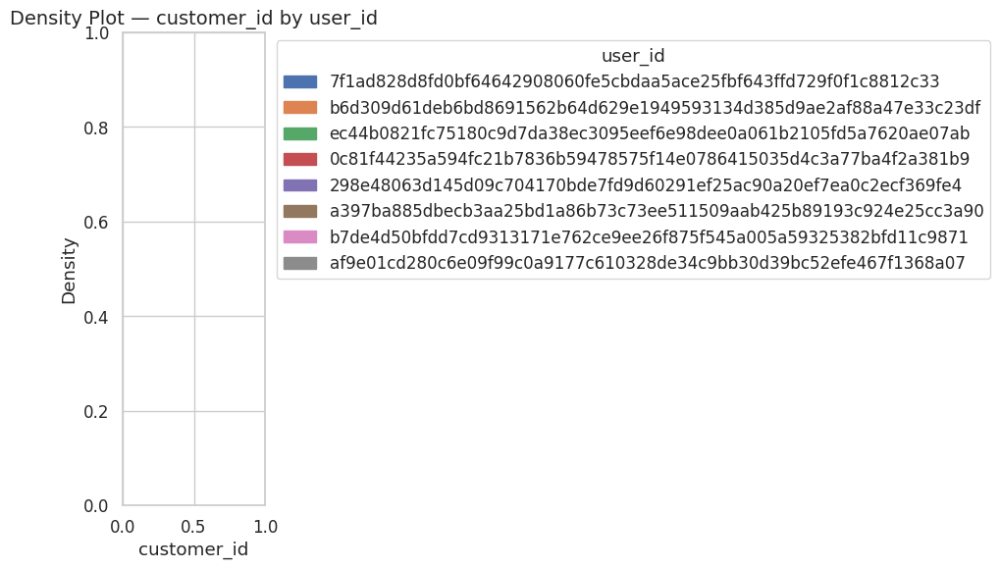

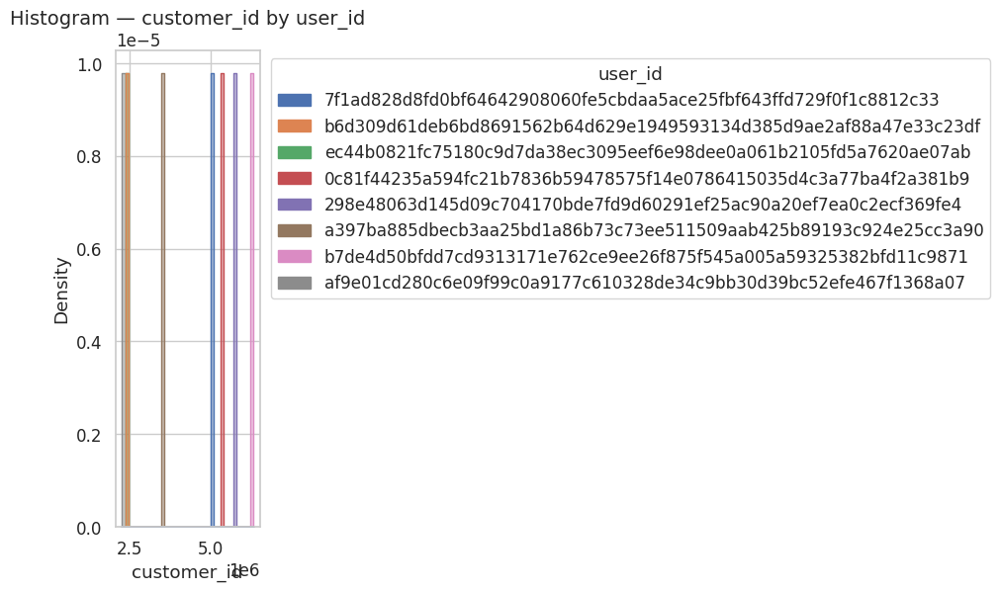

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


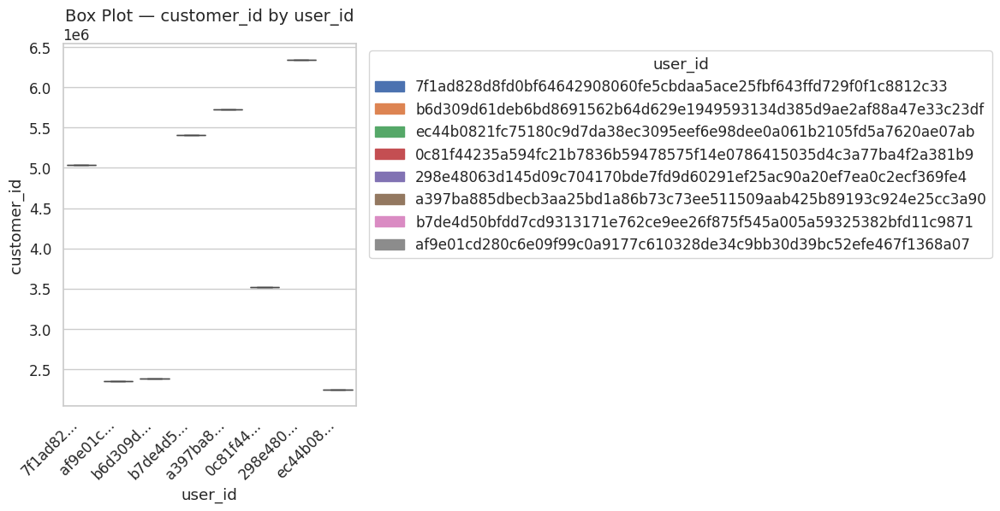


📊 Vẽ biểu đồ cho cặp: (user_id, location)


/tmp/ipykernel_4158223/4165398934.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


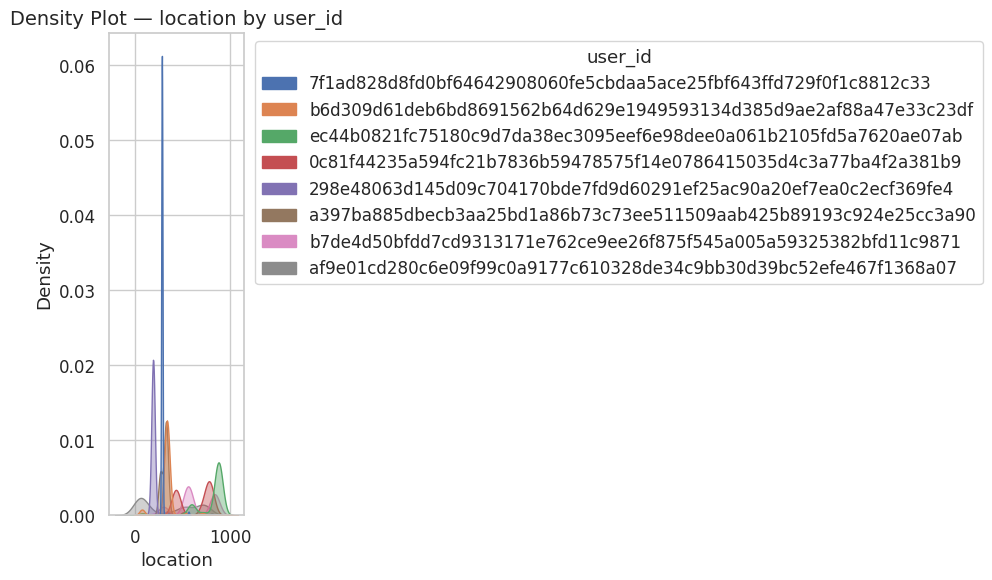

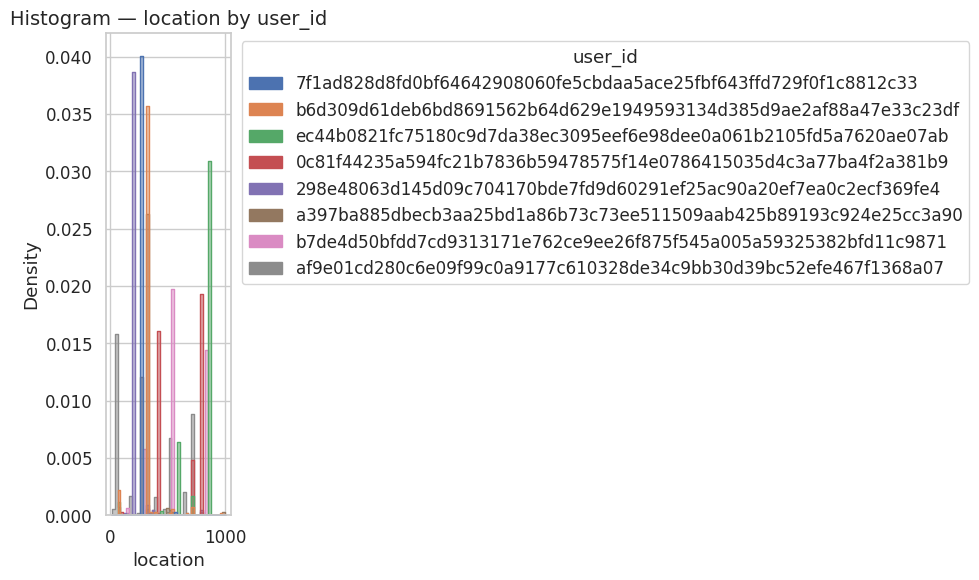

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


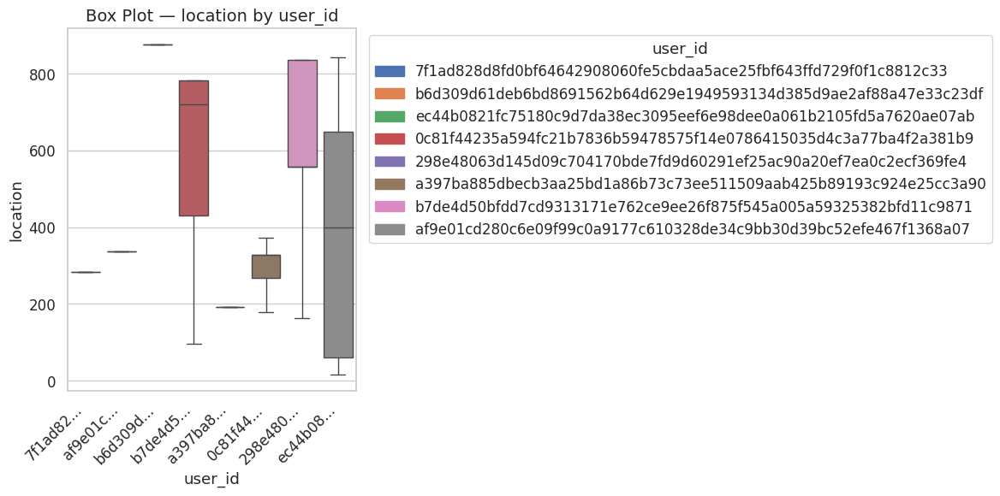


📊 Vẽ biểu đồ cho cặp: (user_id, discount)


/tmp/ipykernel_4158223/4165398934.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


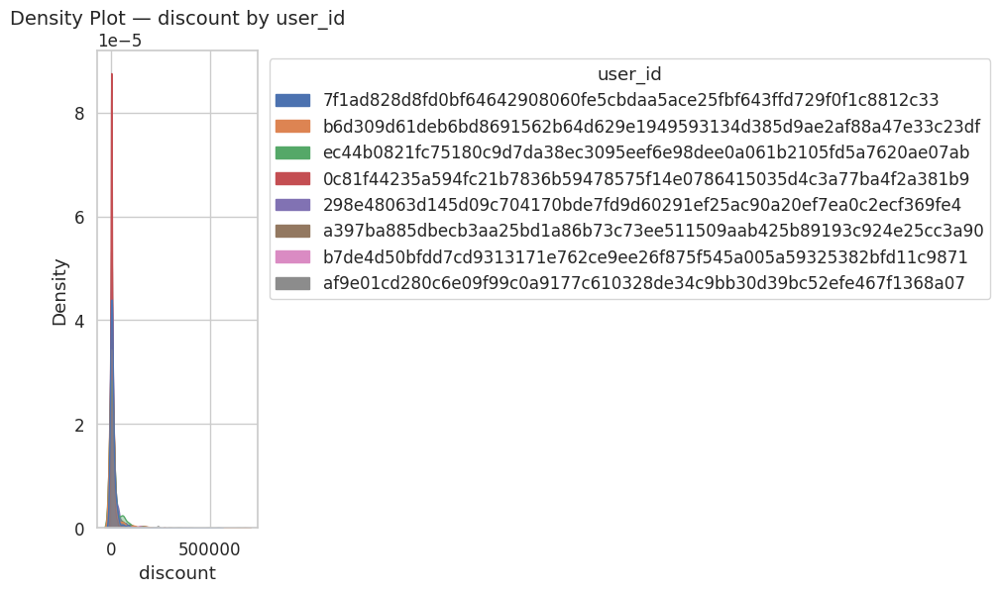

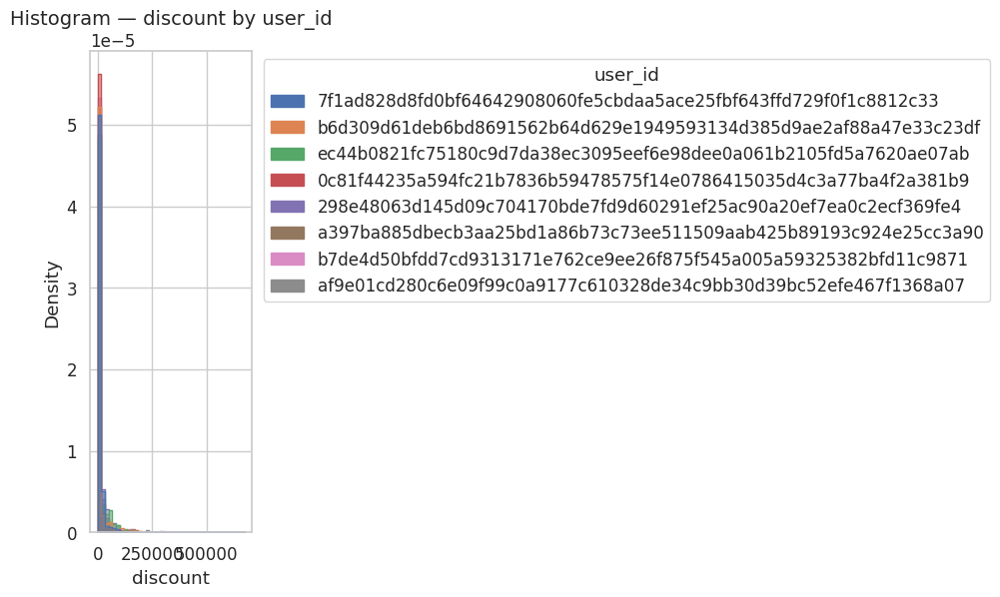

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


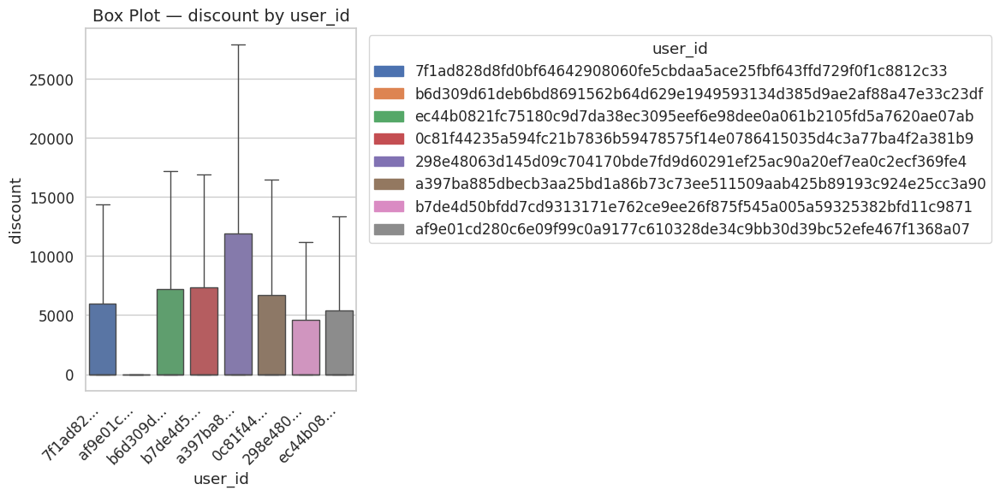


📊 Vẽ biểu đồ cho cặp: (item_id, timestamp)


/tmp/ipykernel_4158223/4165398934.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_4158223/4165398934.py:59: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.kdeplot(


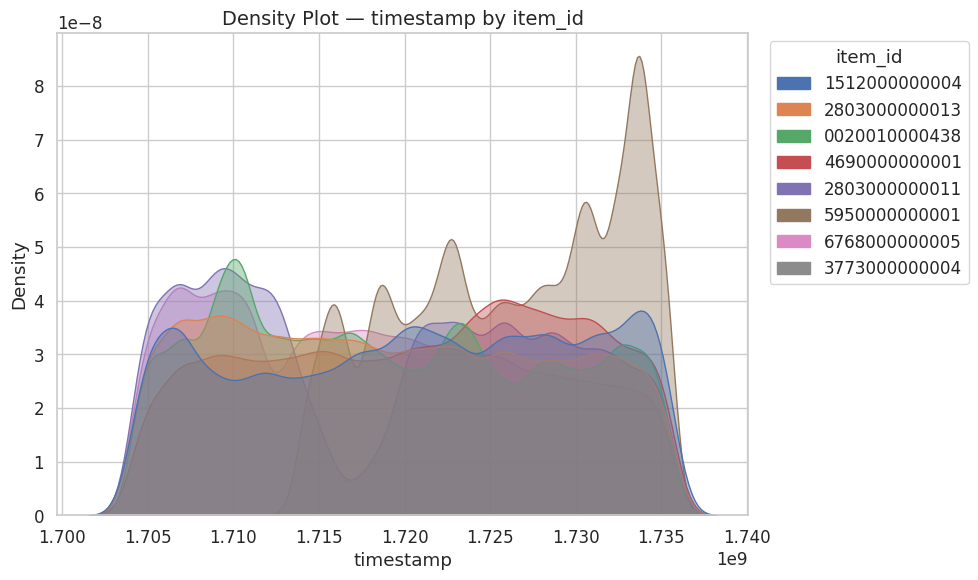

/tmp/ipykernel_4158223/4165398934.py:82: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.histplot(


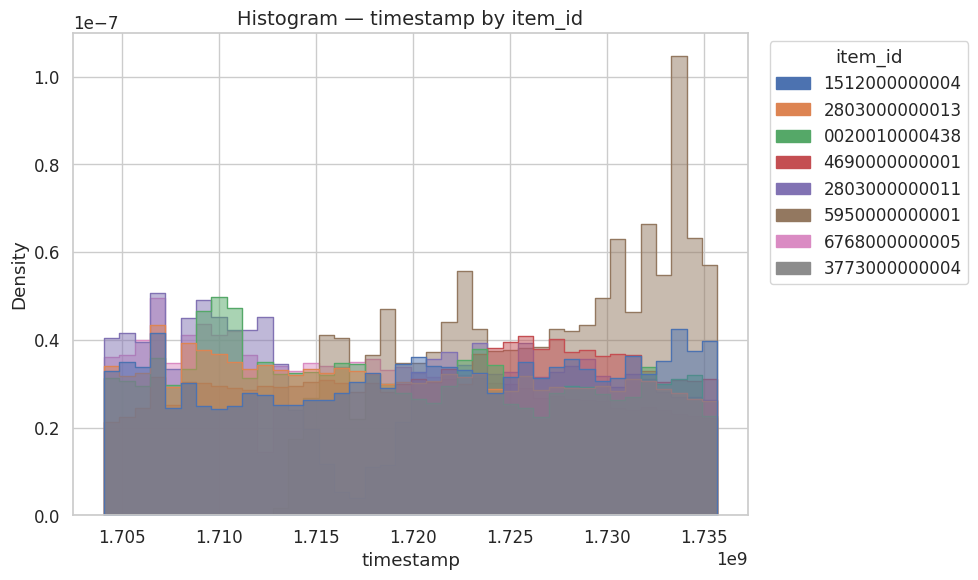

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/tmp/ipykernel_4158223/4165398934.py:105: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.boxplot(


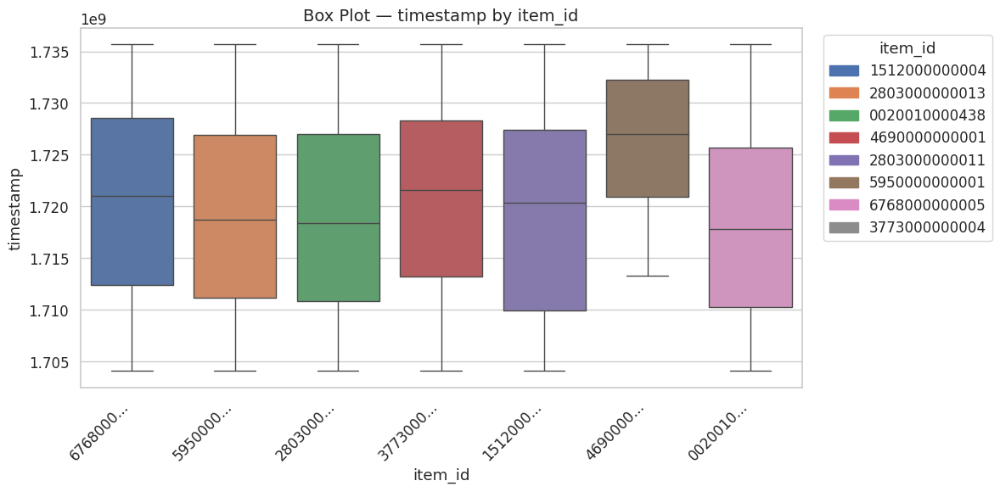


📊 Vẽ biểu đồ cho cặp: (item_id, event_value)


/tmp/ipykernel_4158223/4165398934.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_4158223/4165398934.py:59: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.kdeplot(


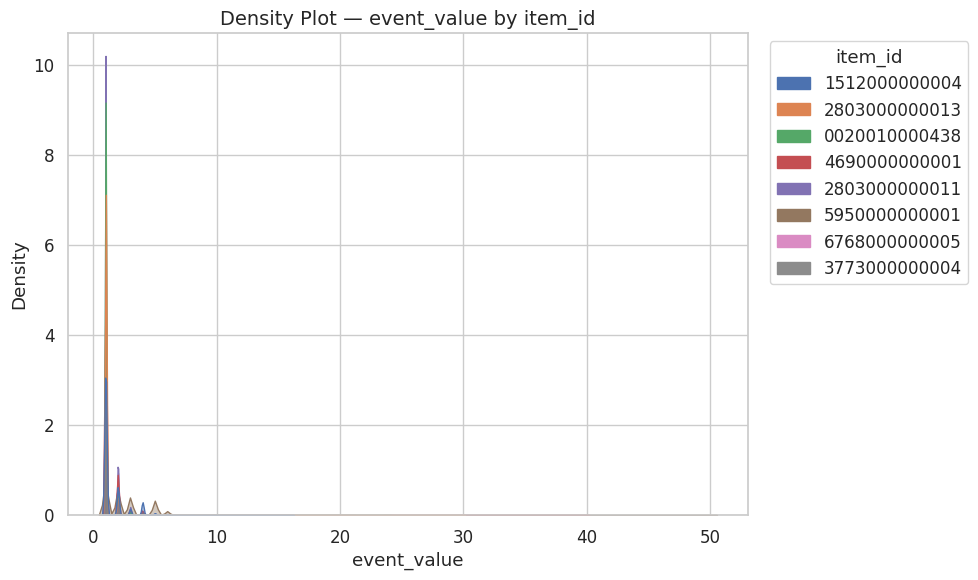

/tmp/ipykernel_4158223/4165398934.py:82: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.histplot(


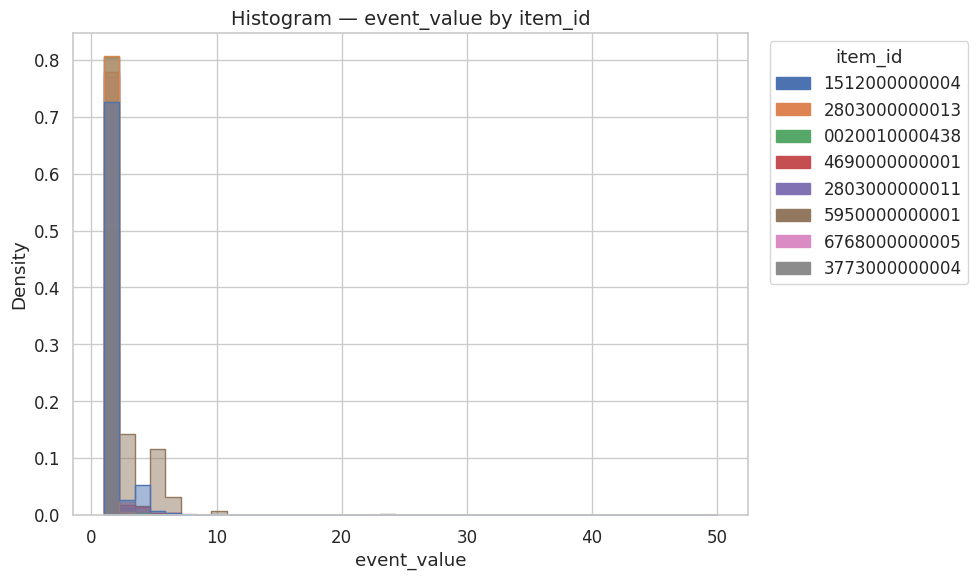

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/tmp/ipykernel_4158223/4165398934.py:105: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.boxplot(


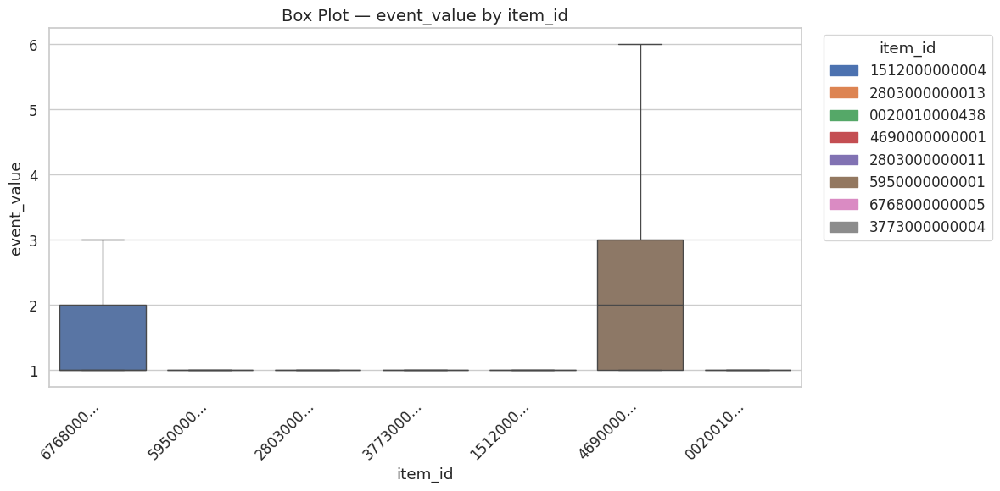


📊 Vẽ biểu đồ cho cặp: (item_id, price)


/tmp/ipykernel_4158223/4165398934.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_4158223/4165398934.py:59: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.kdeplot(


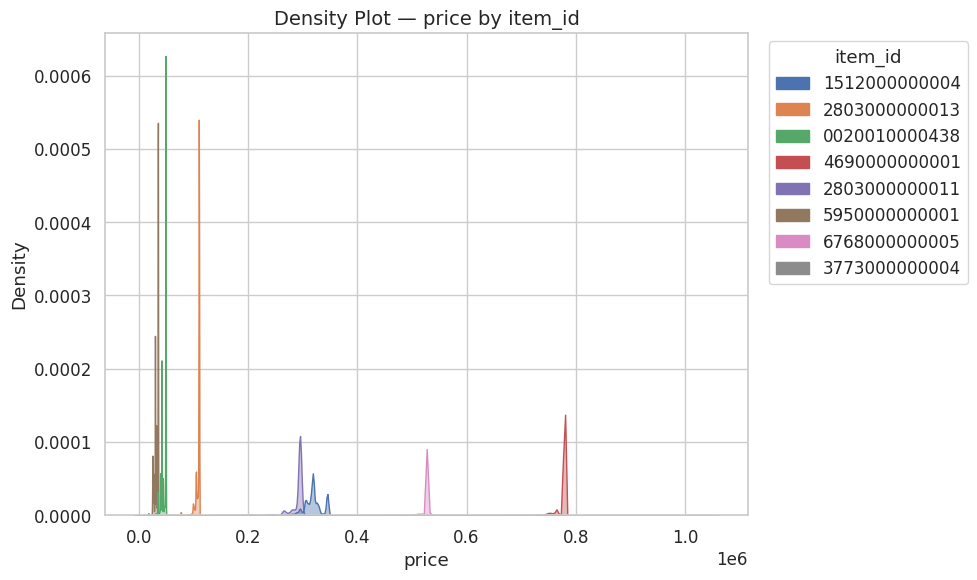

/tmp/ipykernel_4158223/4165398934.py:82: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.histplot(


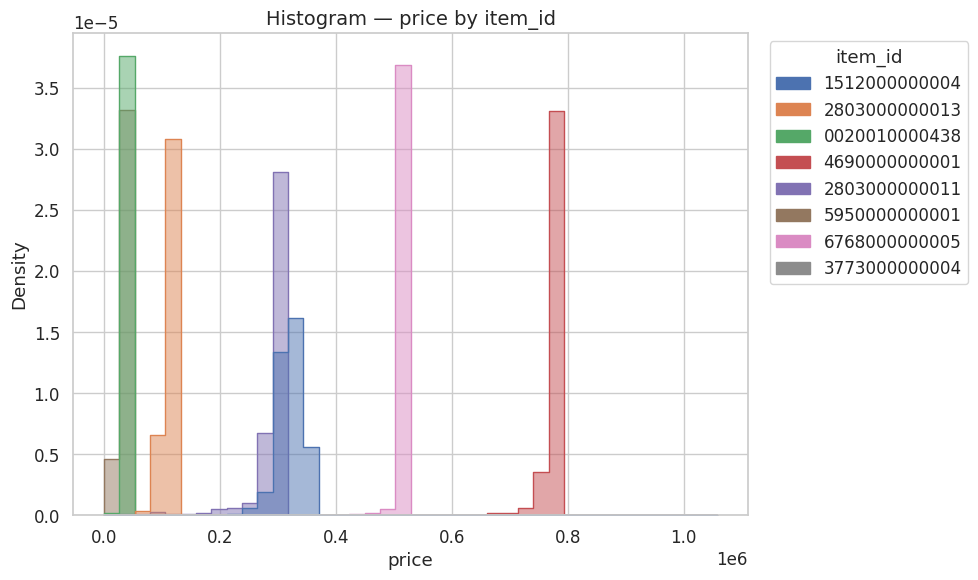

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/tmp/ipykernel_4158223/4165398934.py:105: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.boxplot(


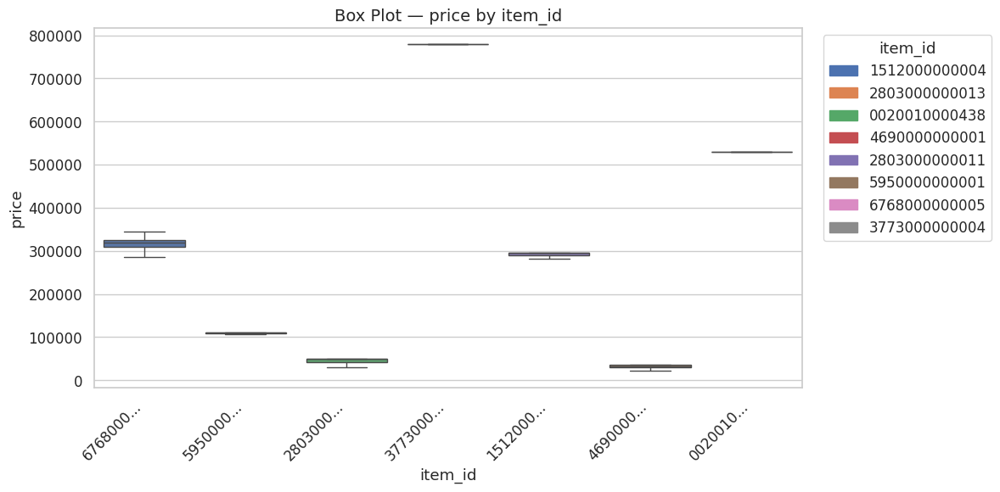


📊 Vẽ biểu đồ cho cặp: (item_id, date_key)


/tmp/ipykernel_4158223/4165398934.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_4158223/4165398934.py:59: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.kdeplot(


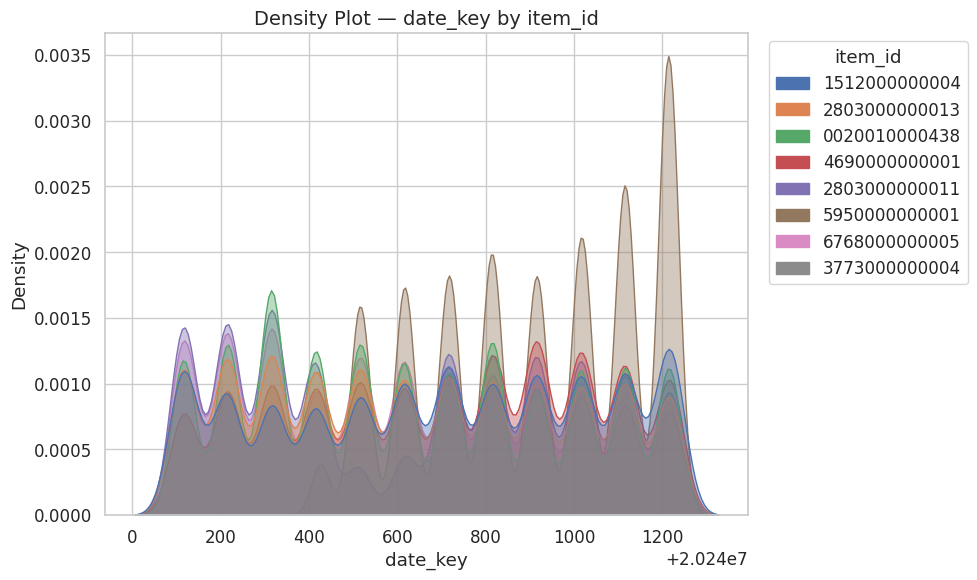

/tmp/ipykernel_4158223/4165398934.py:82: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.histplot(


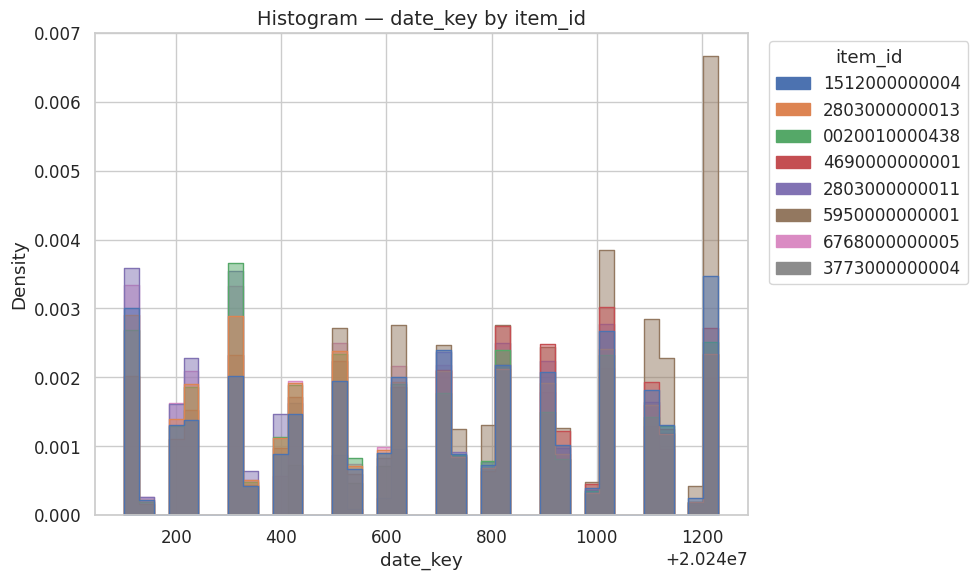

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/tmp/ipykernel_4158223/4165398934.py:105: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.boxplot(


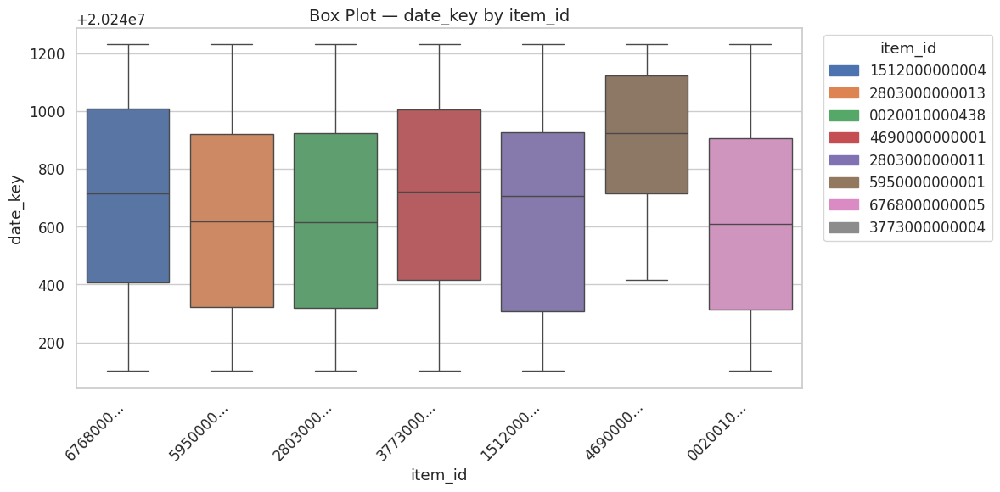


📊 Vẽ biểu đồ cho cặp: (item_id, quantity)


/tmp/ipykernel_4158223/4165398934.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_4158223/4165398934.py:59: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.kdeplot(


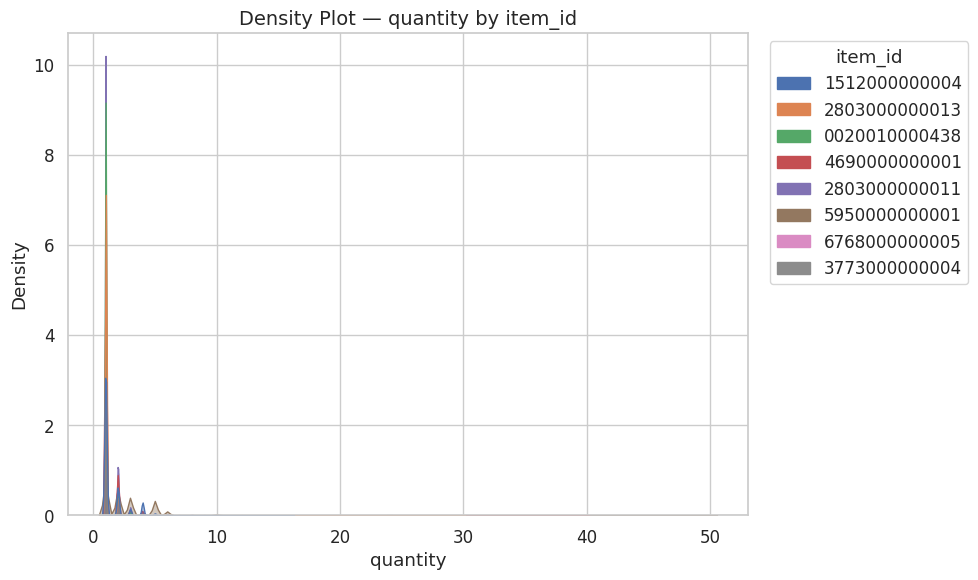

/tmp/ipykernel_4158223/4165398934.py:82: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.histplot(


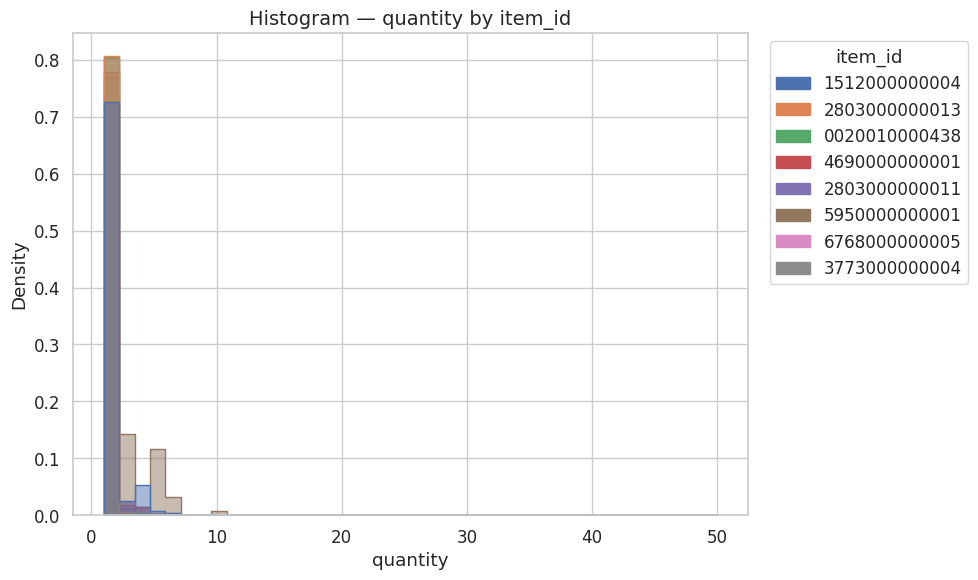

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/tmp/ipykernel_4158223/4165398934.py:105: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.boxplot(


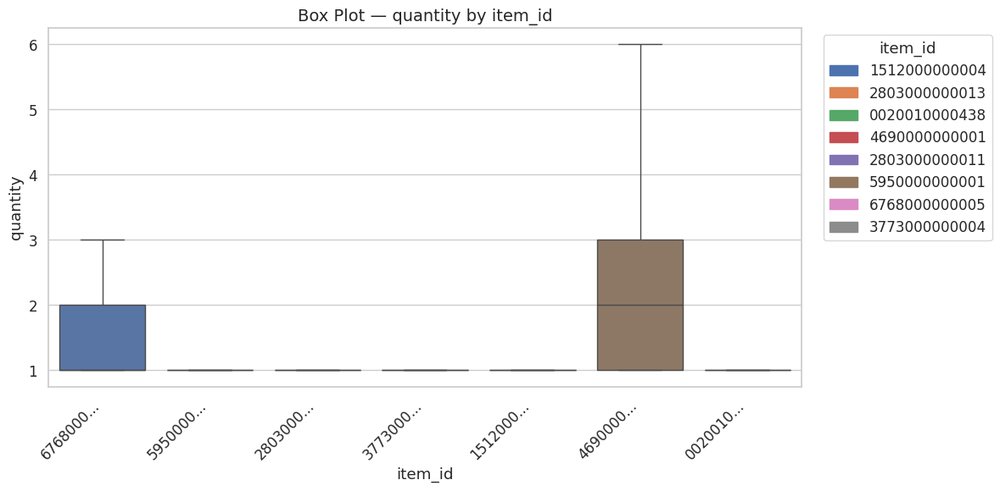


📊 Vẽ biểu đồ cho cặp: (item_id, customer_id)


/tmp/ipykernel_4158223/4165398934.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_4158223/4165398934.py:59: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.kdeplot(


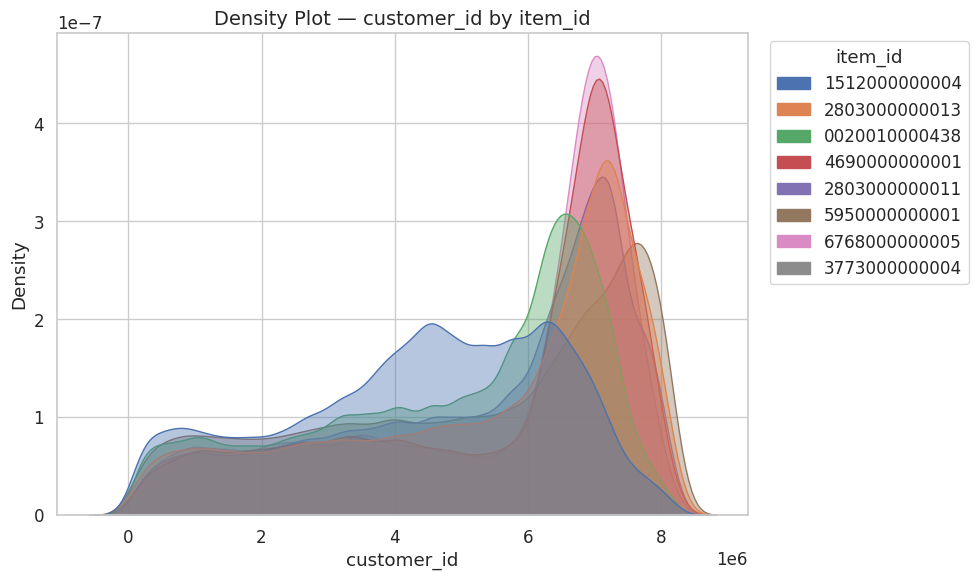

/tmp/ipykernel_4158223/4165398934.py:82: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.histplot(


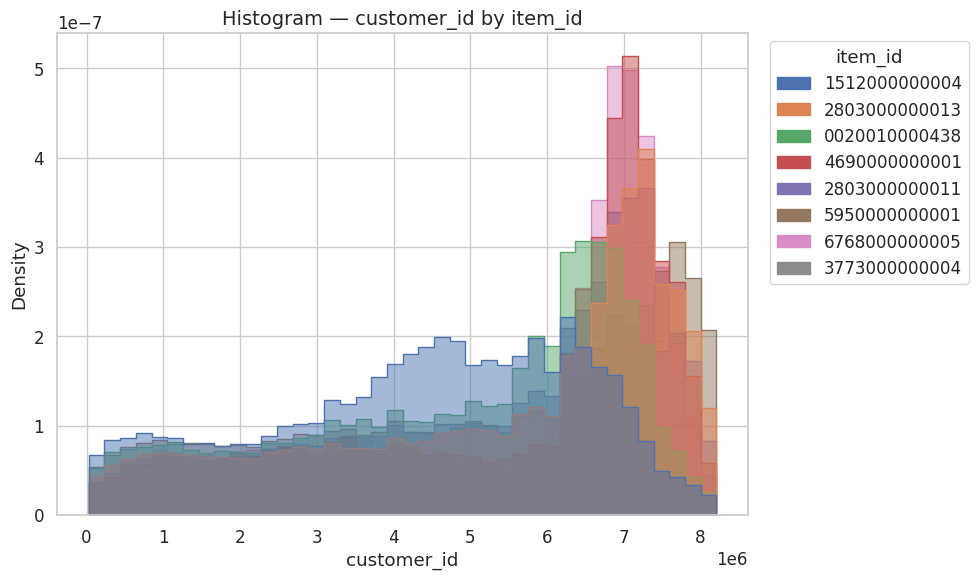

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/tmp/ipykernel_4158223/4165398934.py:105: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.boxplot(


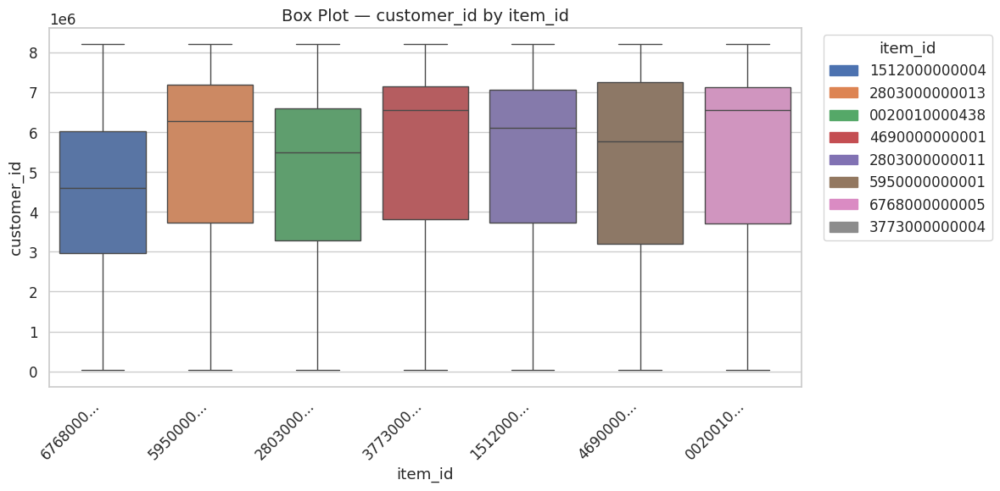


📊 Vẽ biểu đồ cho cặp: (item_id, location)


/tmp/ipykernel_4158223/4165398934.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_4158223/4165398934.py:59: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.kdeplot(


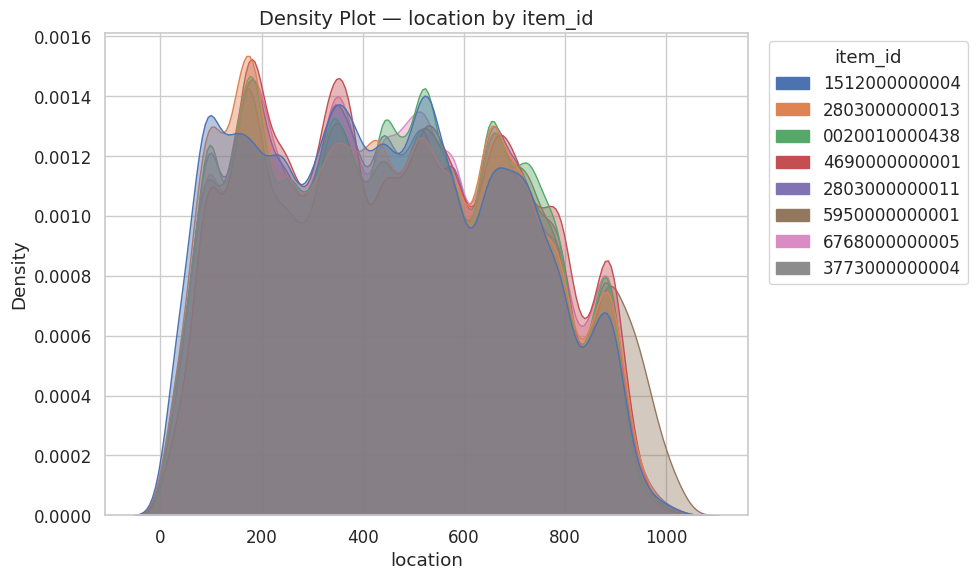

/tmp/ipykernel_4158223/4165398934.py:82: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.histplot(


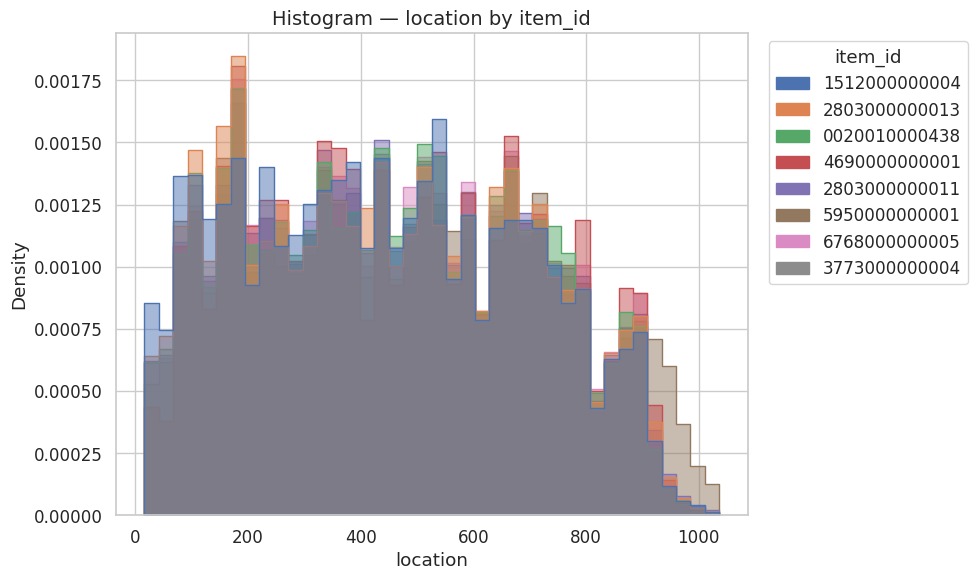

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/tmp/ipykernel_4158223/4165398934.py:105: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.boxplot(


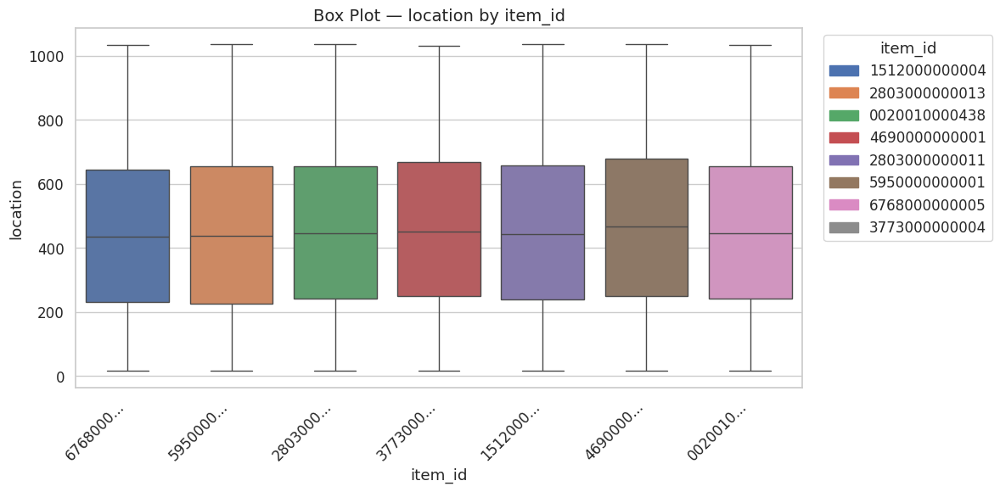


📊 Vẽ biểu đồ cho cặp: (item_id, discount)


/tmp/ipykernel_4158223/4165398934.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_4158223/4165398934.py:59: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.kdeplot(


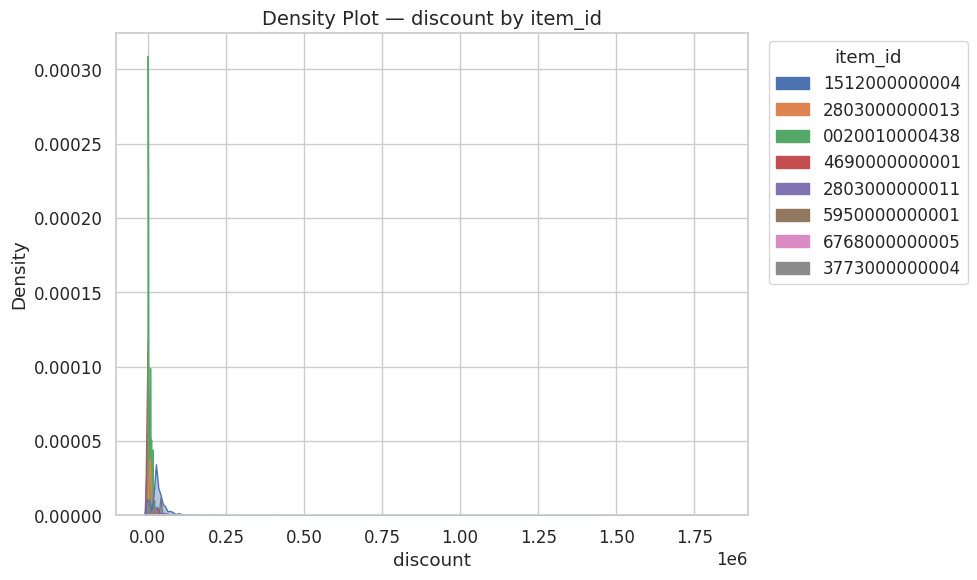

/tmp/ipykernel_4158223/4165398934.py:82: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.histplot(


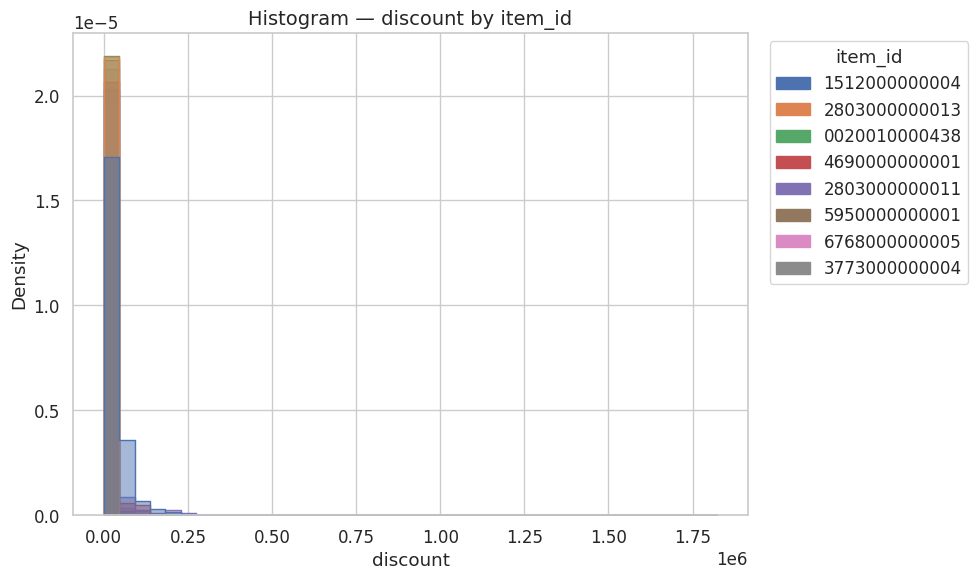

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
/tmp/ipykernel_4158223/4165398934.py:105: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  ax = sns.boxplot(


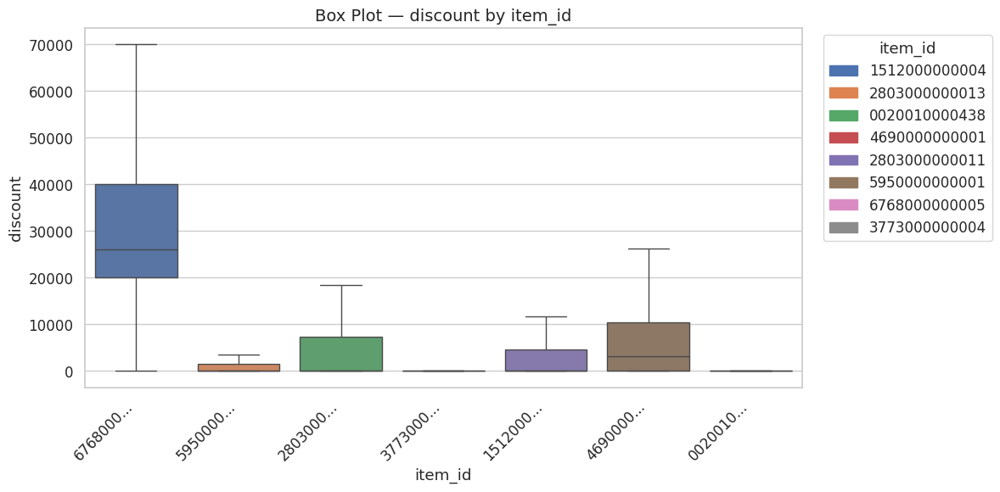


📊 Vẽ biểu đồ cho cặp: (event_type, timestamp)


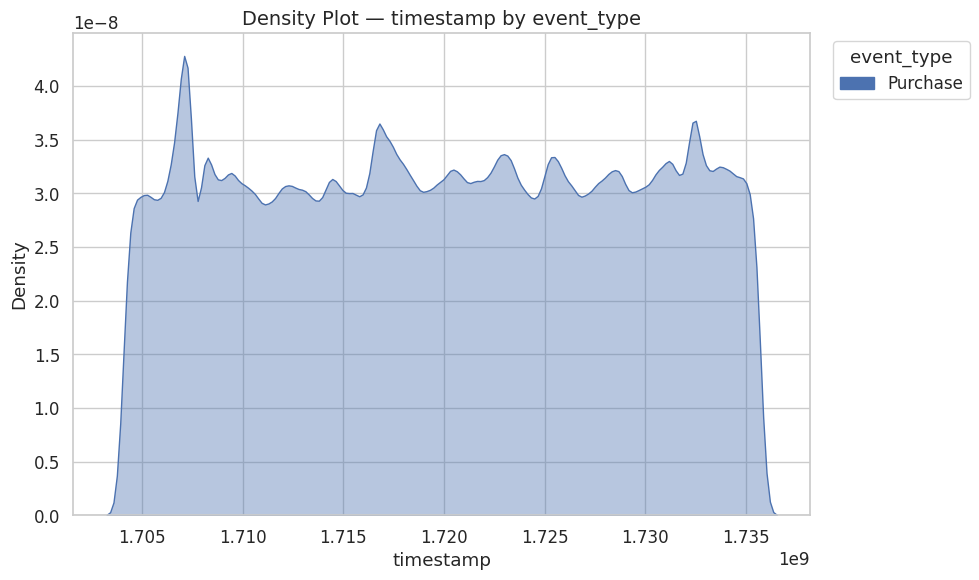

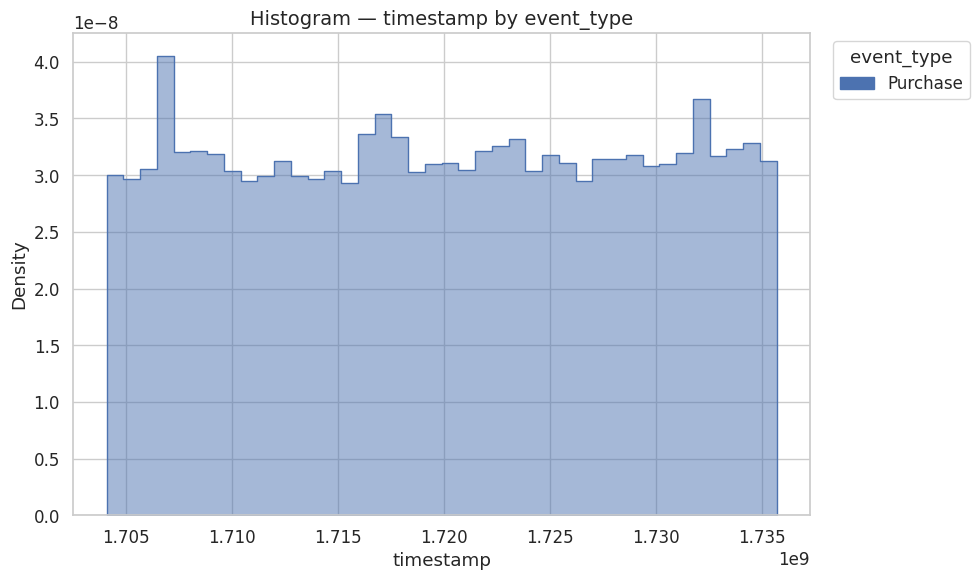

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


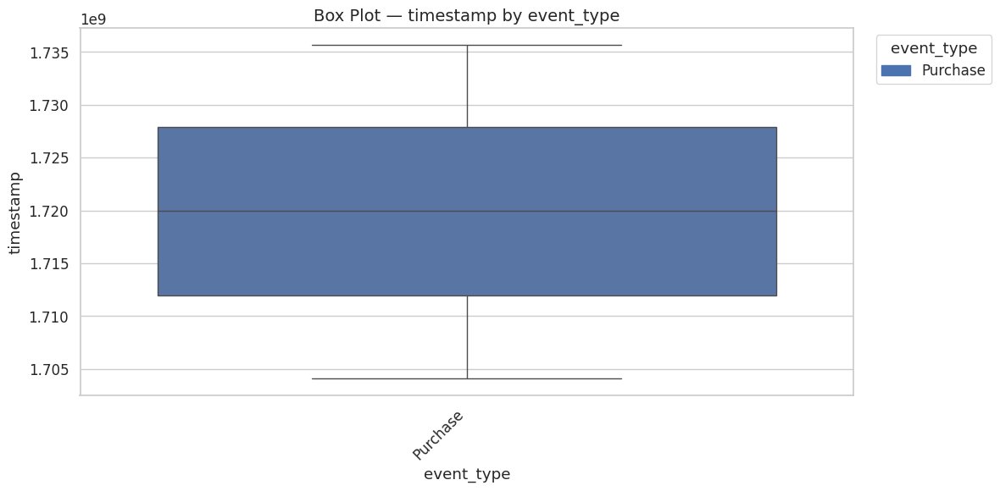


📊 Vẽ biểu đồ cho cặp: (event_type, event_value)


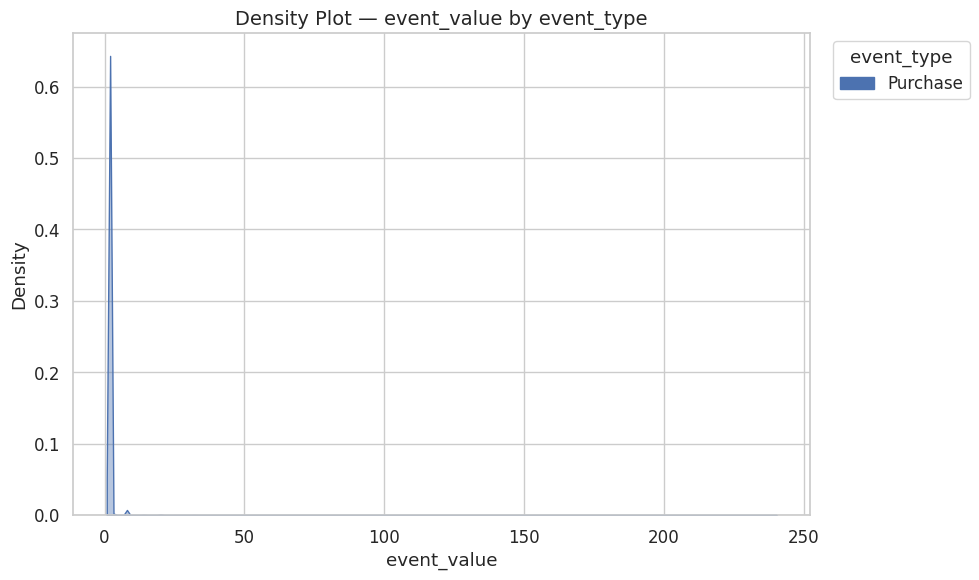

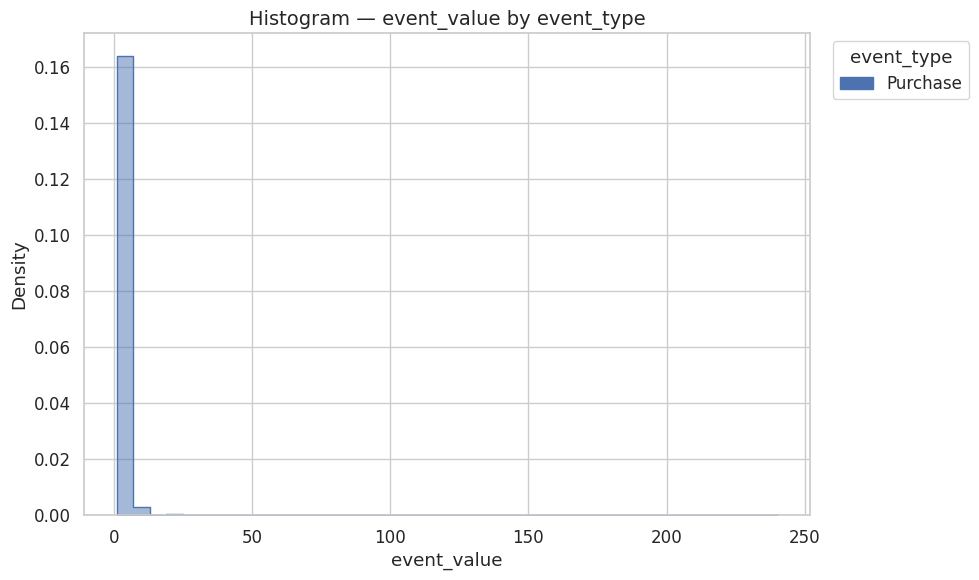

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


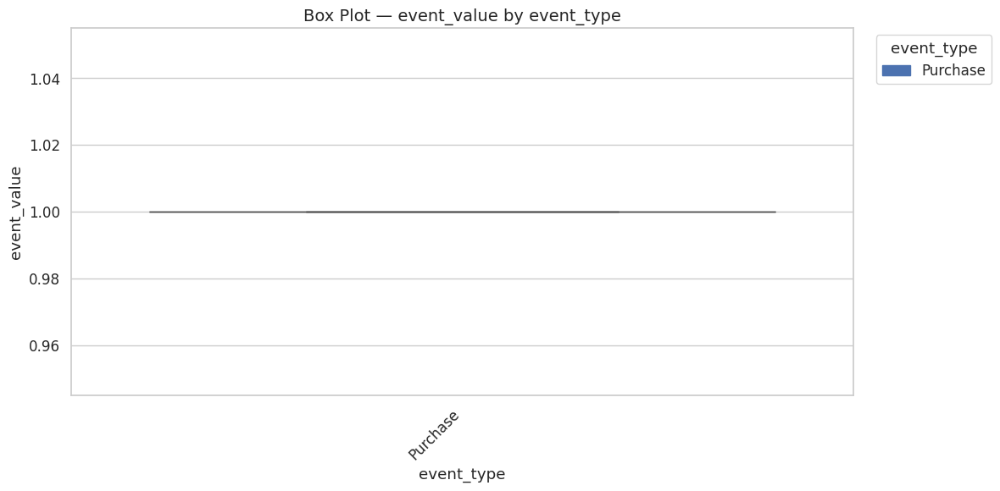


📊 Vẽ biểu đồ cho cặp: (event_type, price)


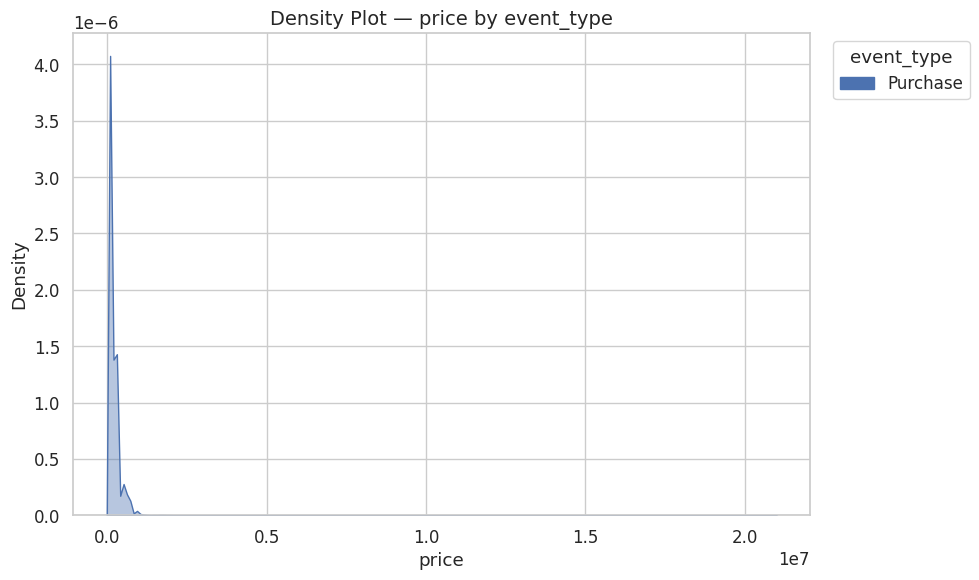

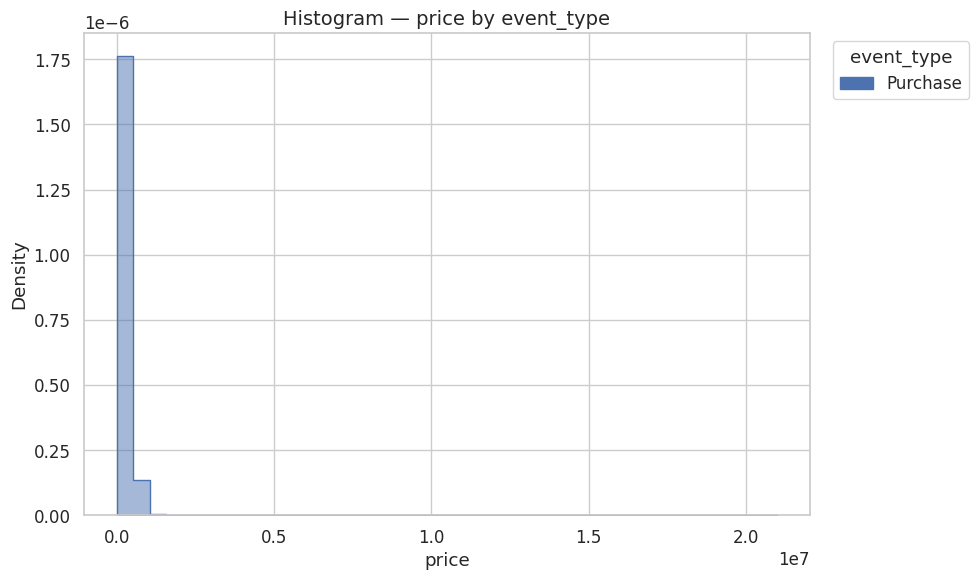

/tmp/ipykernel_4158223/4165398934.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


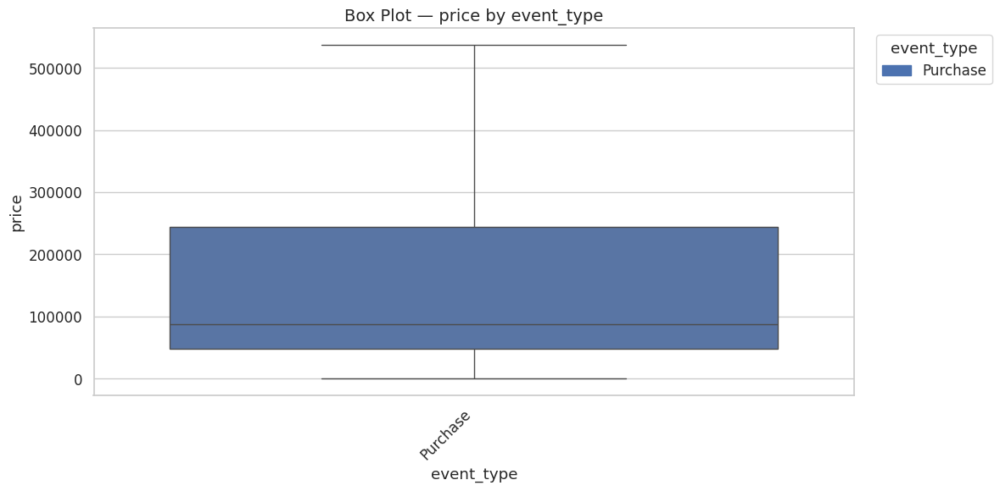


📊 Vẽ biểu đồ cho cặp: (event_type, date_key)


In [ ]:

# ===================================================
# 🔹 Gọi hàm cho toàn bộ cặp numeric–category
# ===================================================

# # Xác định cột
# numeric_cols = ["price", "gp"]  # hoặc tự động phát hiện bằng dtype
# category_cols = ["category_l1", "category_l2", "category_l3"]

numeric_cols, category_cols = detect_column_types(df_purchase)

print("🔢 Numeric columns:", numeric_cols)
print("🏷️ Category columns:", category_cols)

# Vẽ cho mọi cặp có dữ liệu
for cat_col in category_cols:
    for num_col in numeric_cols:
        print(f"\n📊 Vẽ biểu đồ cho cặp: ({cat_col}, {num_col})")
        plot_numeric_category(df_purchase, cat_col, num_col)

🔢 Numeric columns: ['timestamp', 'event_value', 'price', 'date_key', 'quantity', 'customer_id', 'location', 'discount']
🏷️ Category columns: ['channel', 'payment']

📊 Vẽ biểu đồ cho cặp: (channel, timestamp)


/tmp/ipykernel_2436351/499568005.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


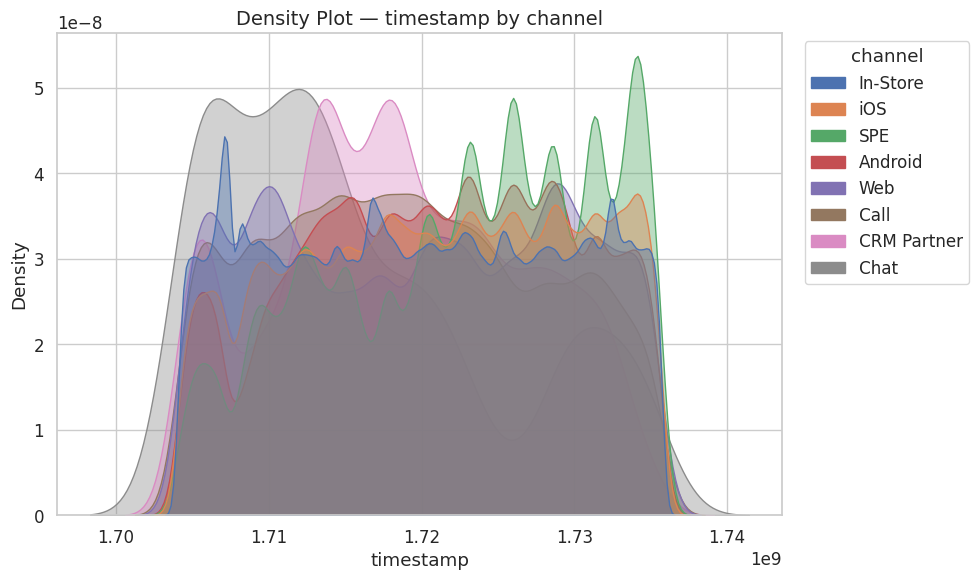

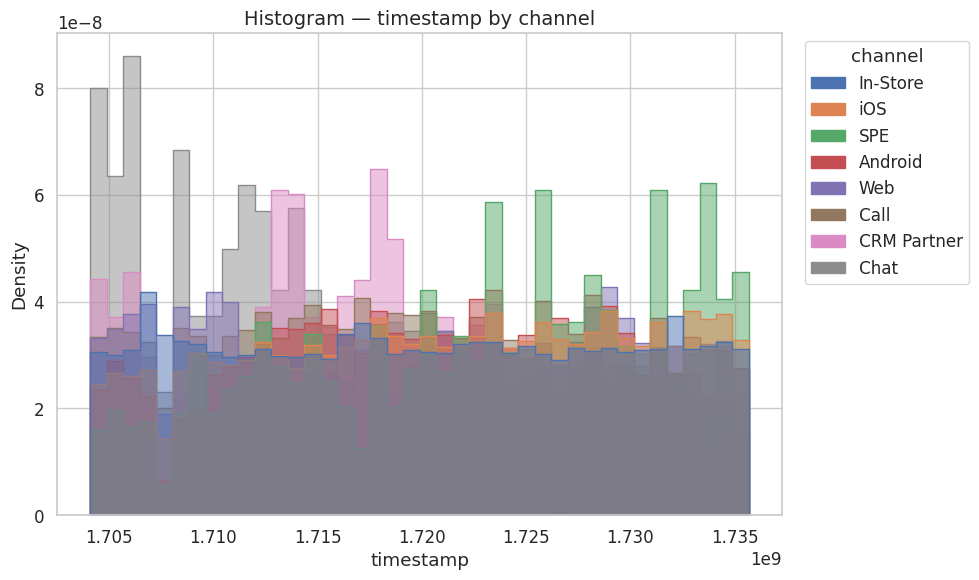

/tmp/ipykernel_2436351/499568005.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


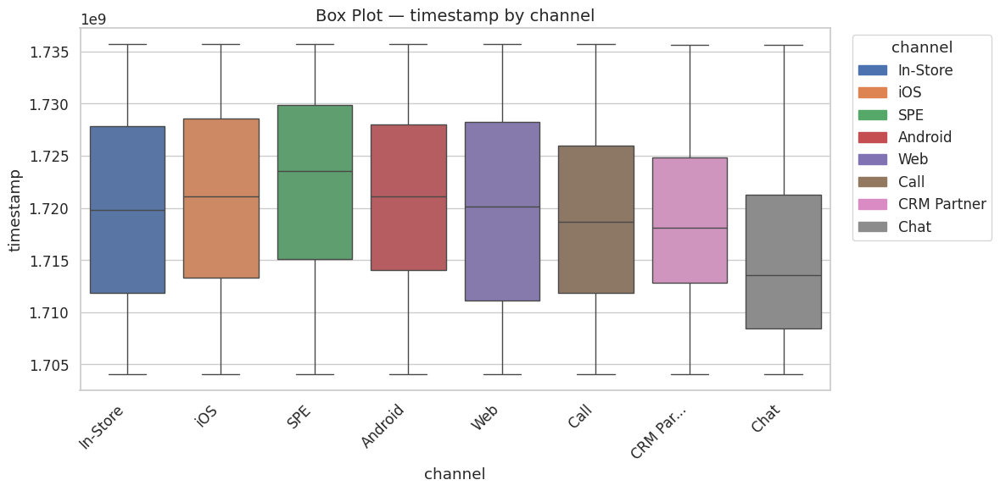


📊 Vẽ biểu đồ cho cặp: (channel, event_value)


/tmp/ipykernel_2436351/499568005.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


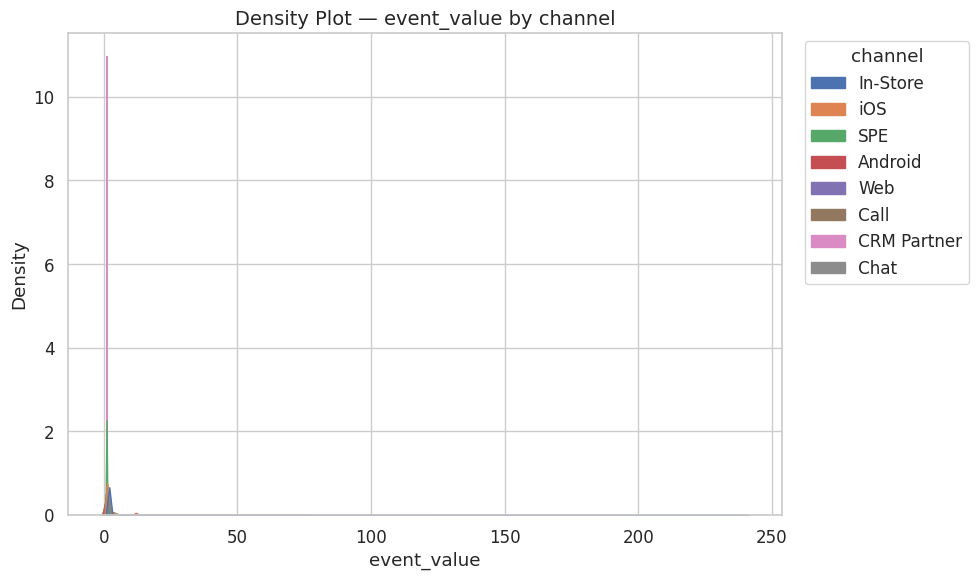

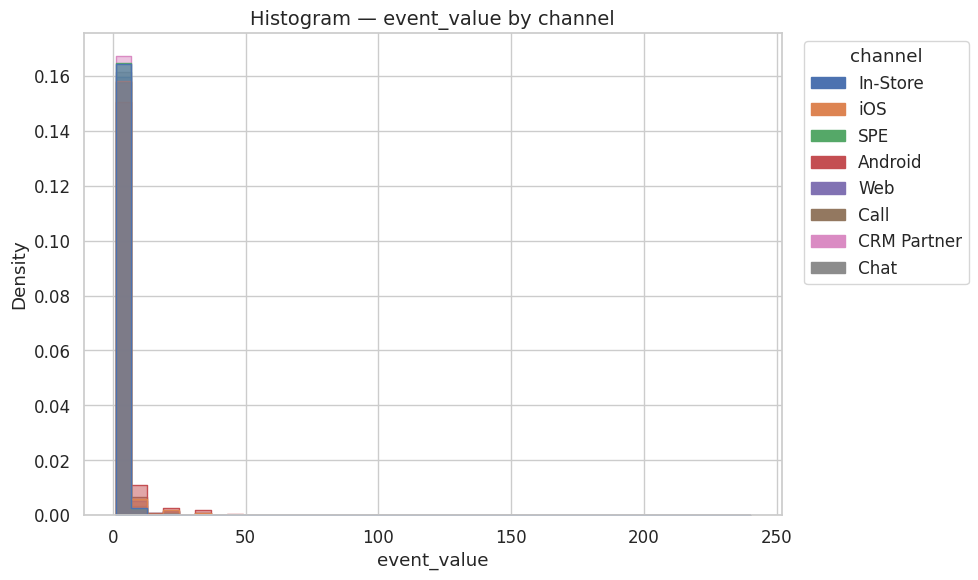

/tmp/ipykernel_2436351/499568005.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


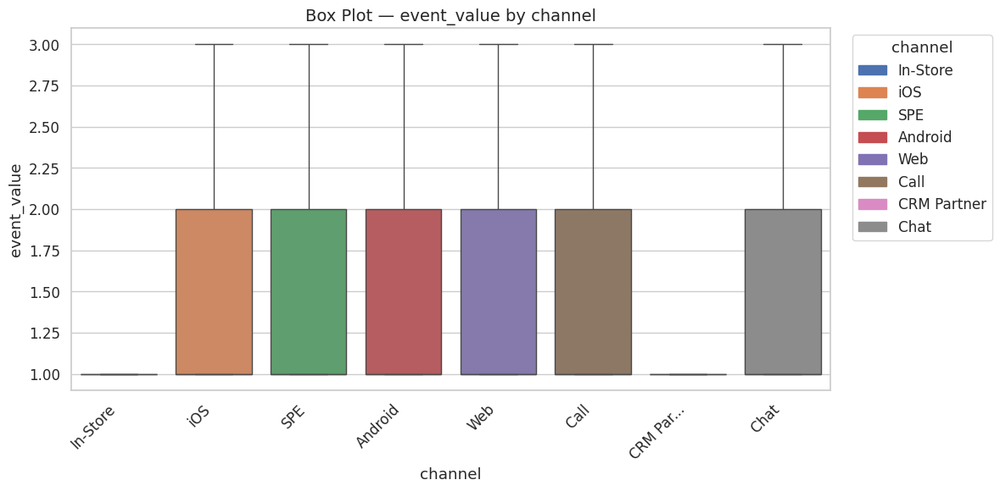


📊 Vẽ biểu đồ cho cặp: (channel, price)


/tmp/ipykernel_2436351/499568005.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


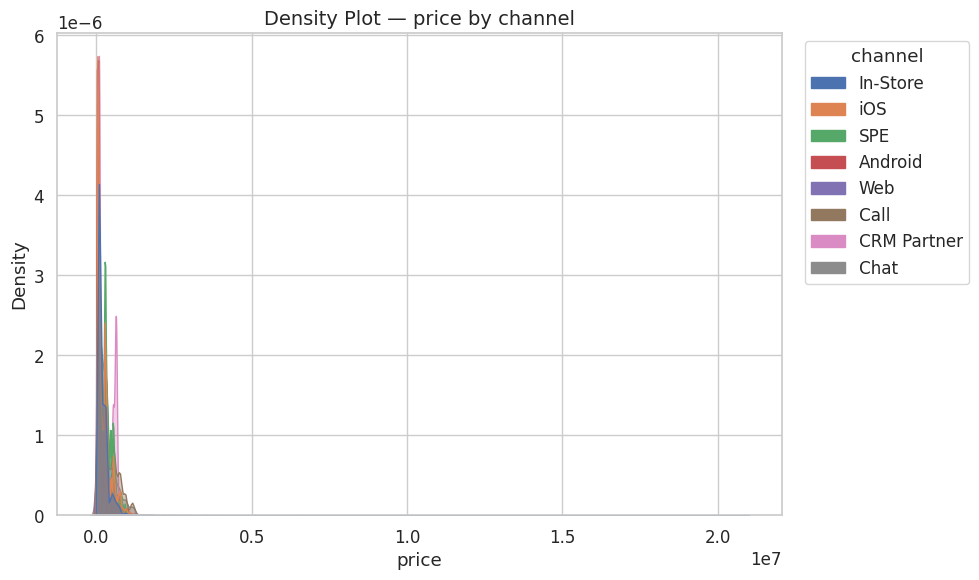

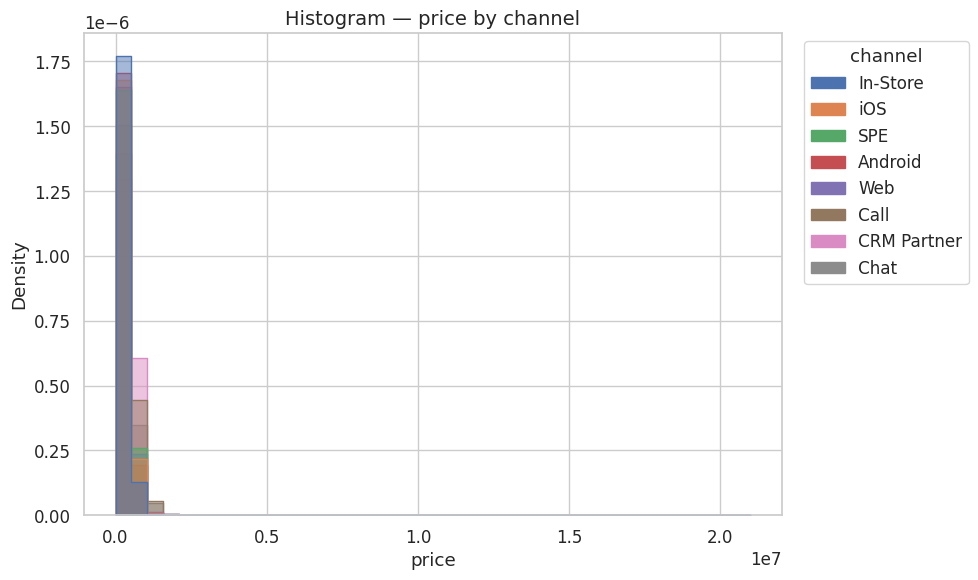

/tmp/ipykernel_2436351/499568005.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


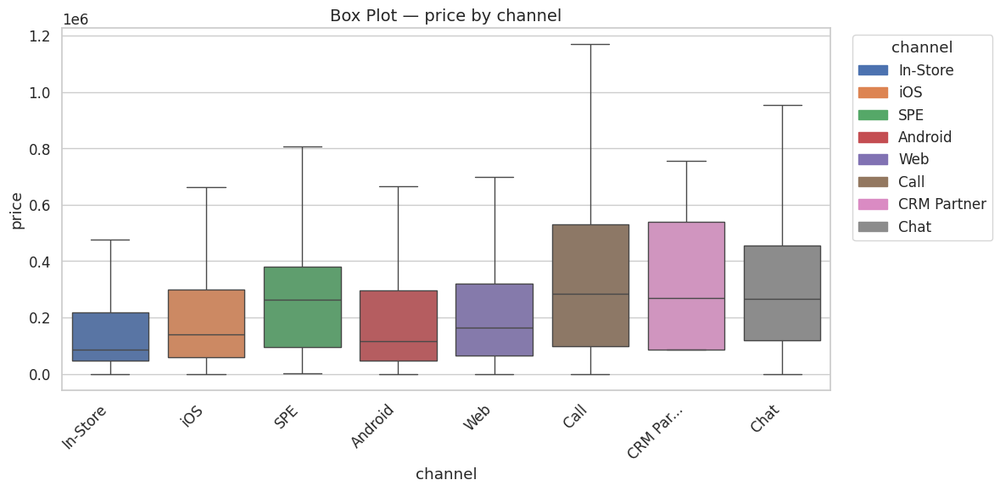


📊 Vẽ biểu đồ cho cặp: (channel, date_key)


/tmp/ipykernel_2436351/499568005.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


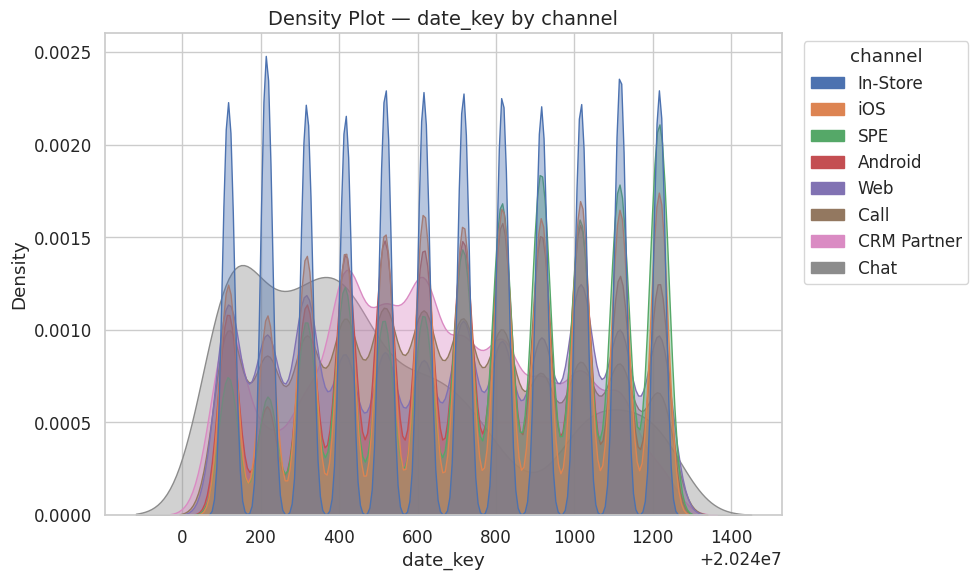

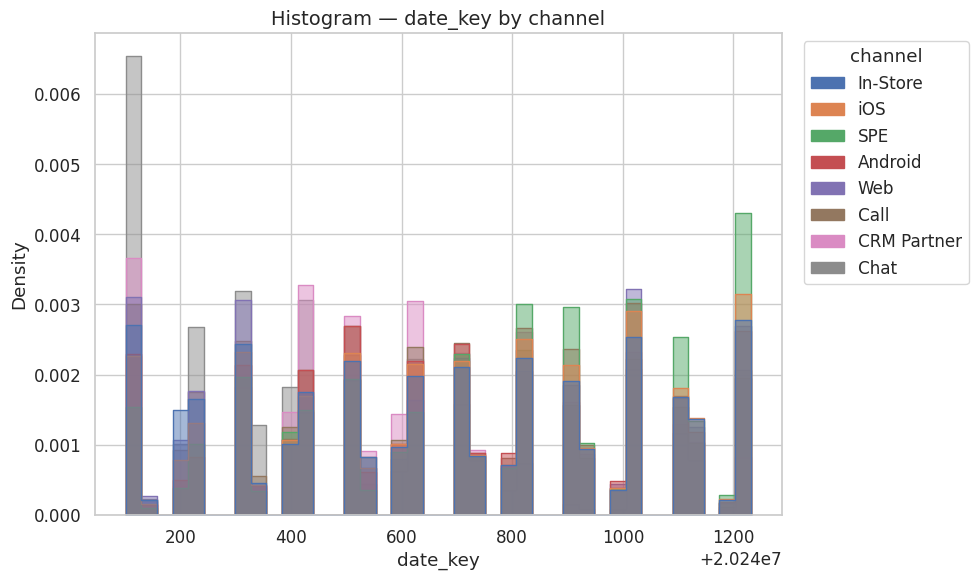

/tmp/ipykernel_2436351/499568005.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


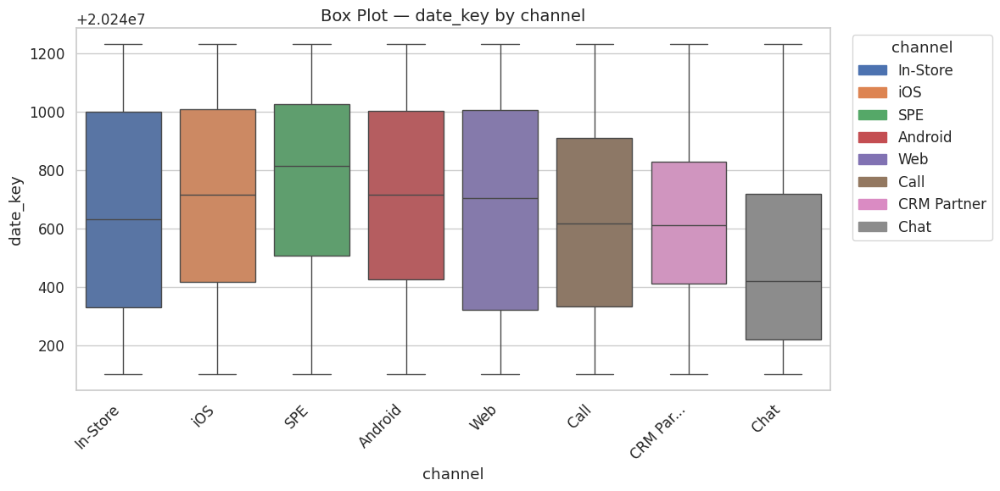


📊 Vẽ biểu đồ cho cặp: (channel, quantity)


/tmp/ipykernel_2436351/499568005.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


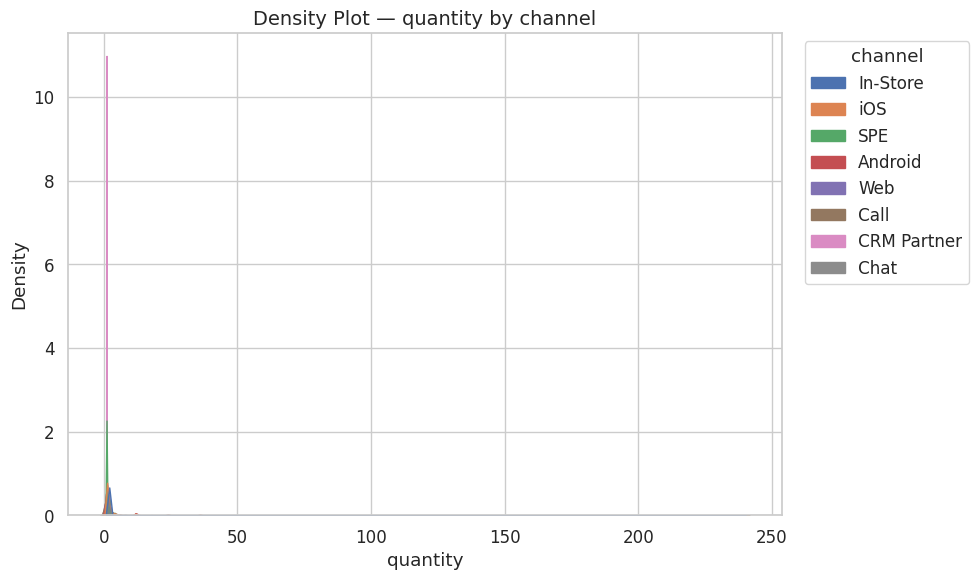

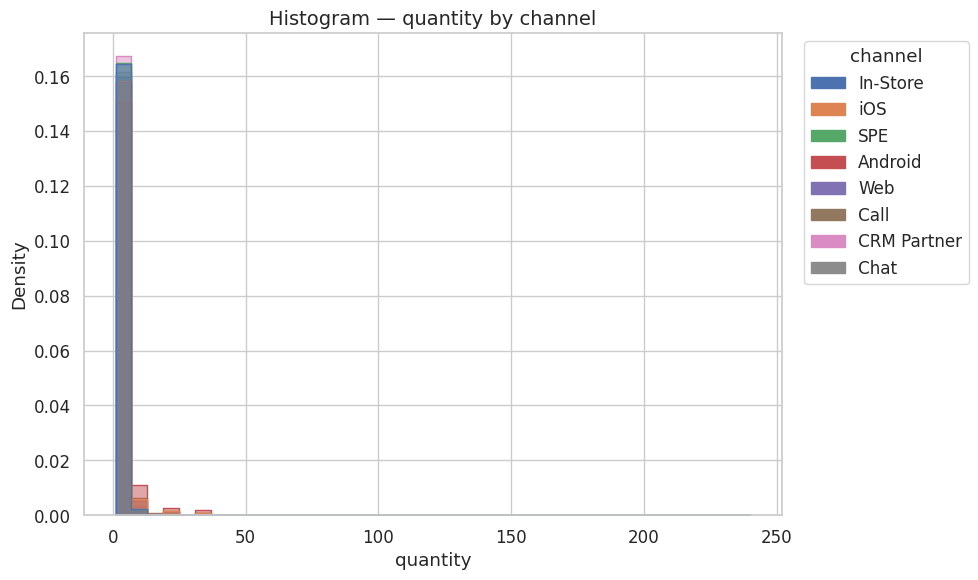

/tmp/ipykernel_2436351/499568005.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


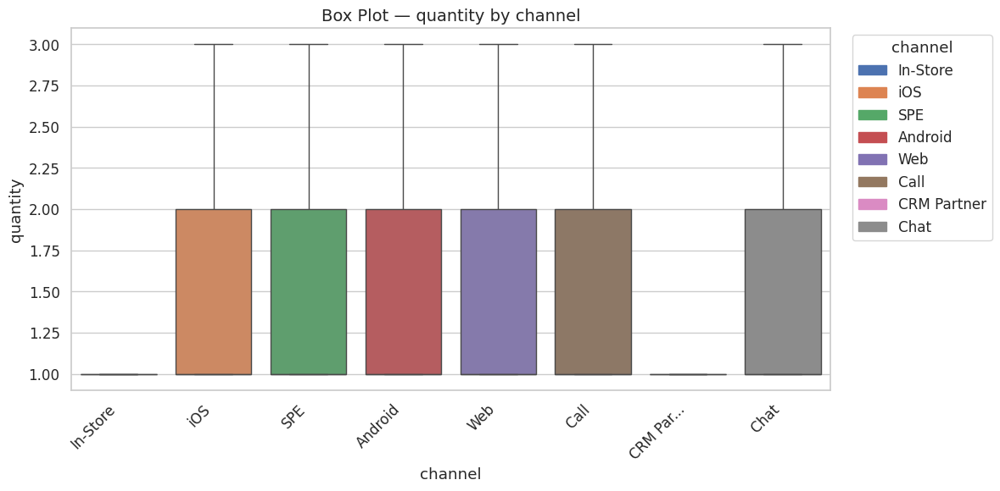


📊 Vẽ biểu đồ cho cặp: (channel, customer_id)


/tmp/ipykernel_2436351/499568005.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


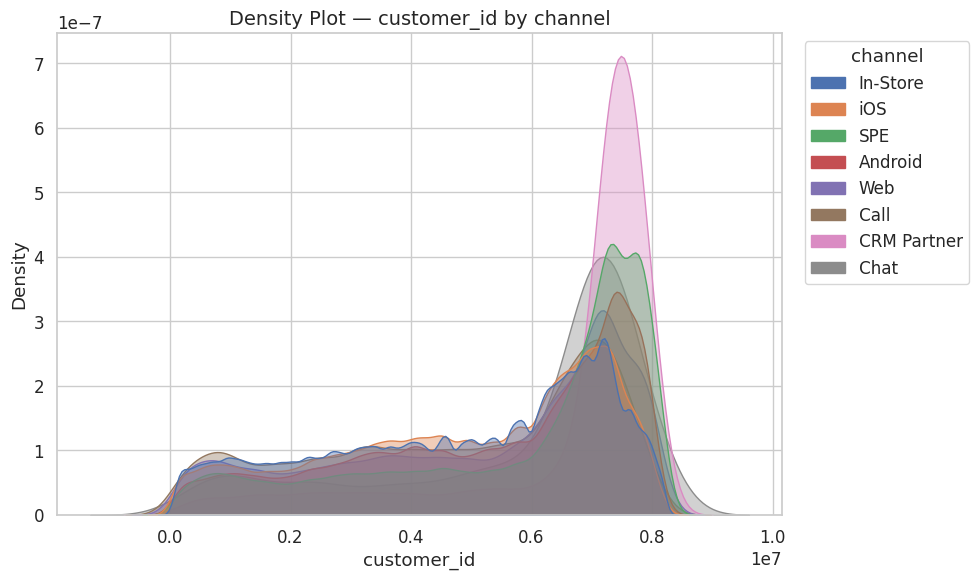

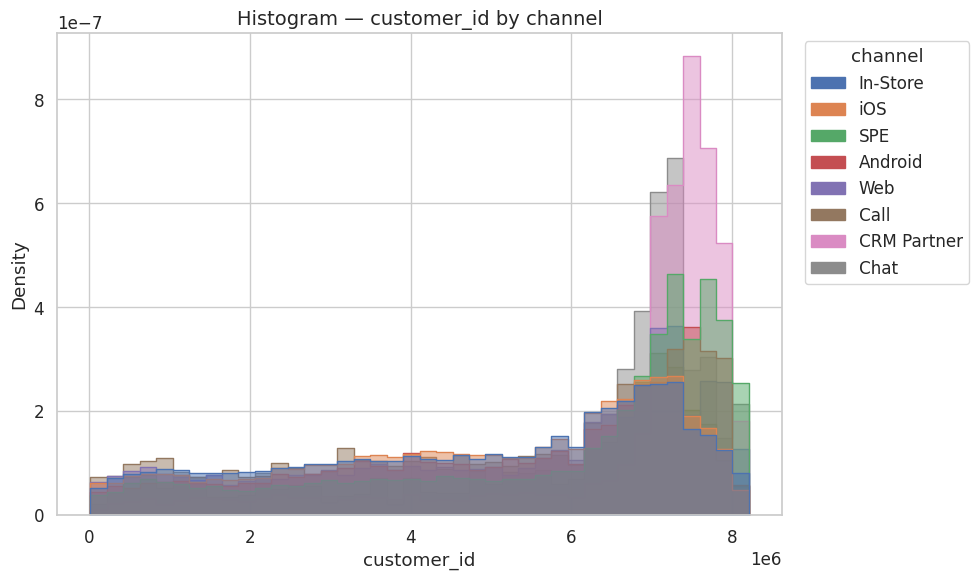

/tmp/ipykernel_2436351/499568005.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


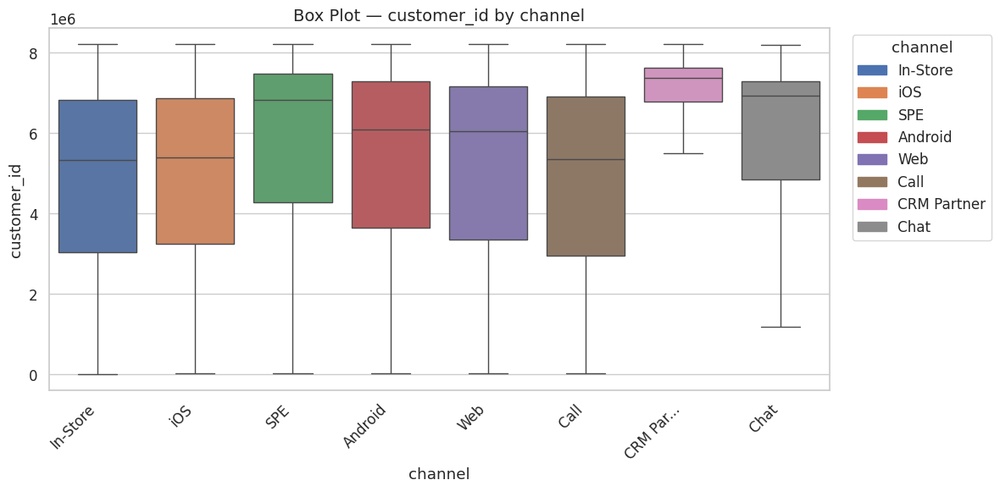


📊 Vẽ biểu đồ cho cặp: (channel, location)


/tmp/ipykernel_2436351/499568005.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


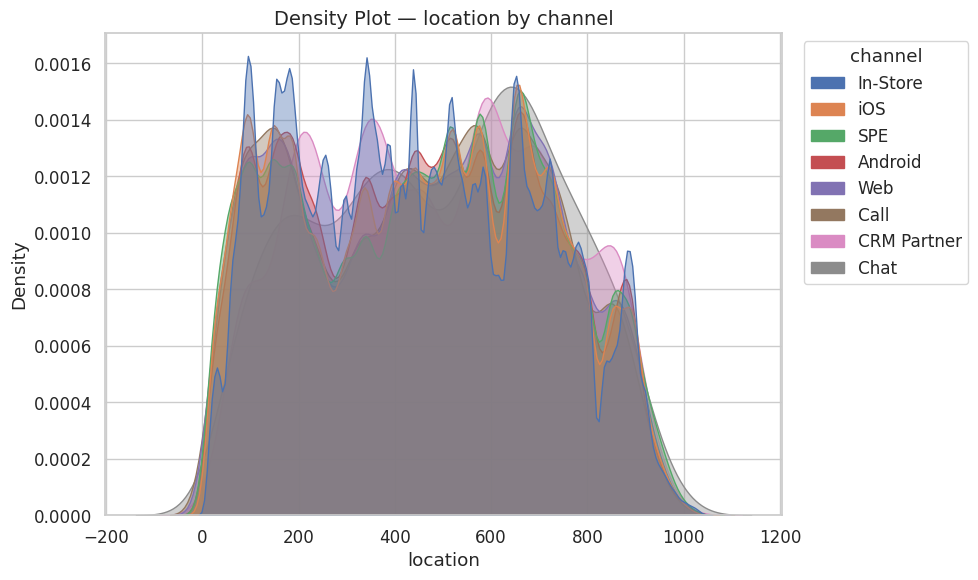

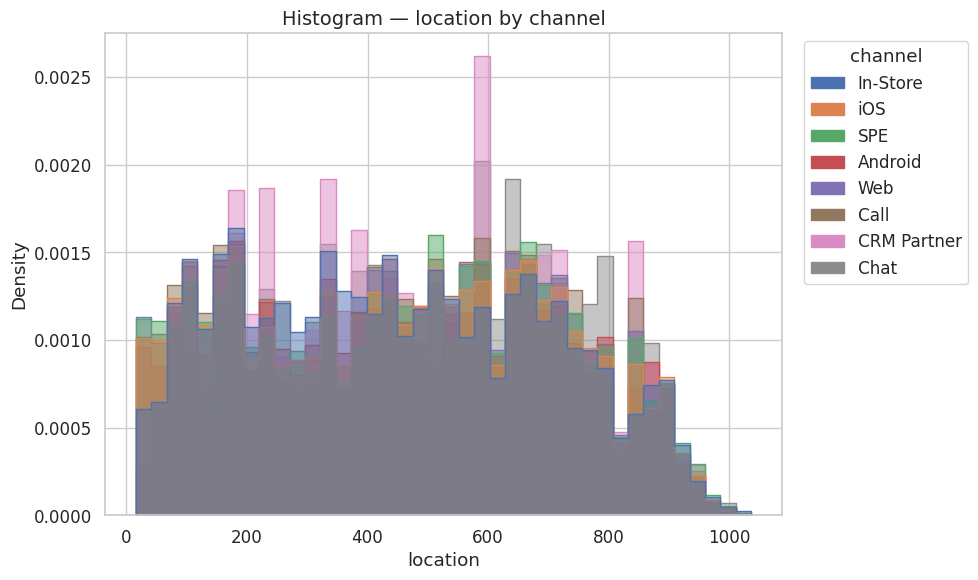

/tmp/ipykernel_2436351/499568005.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


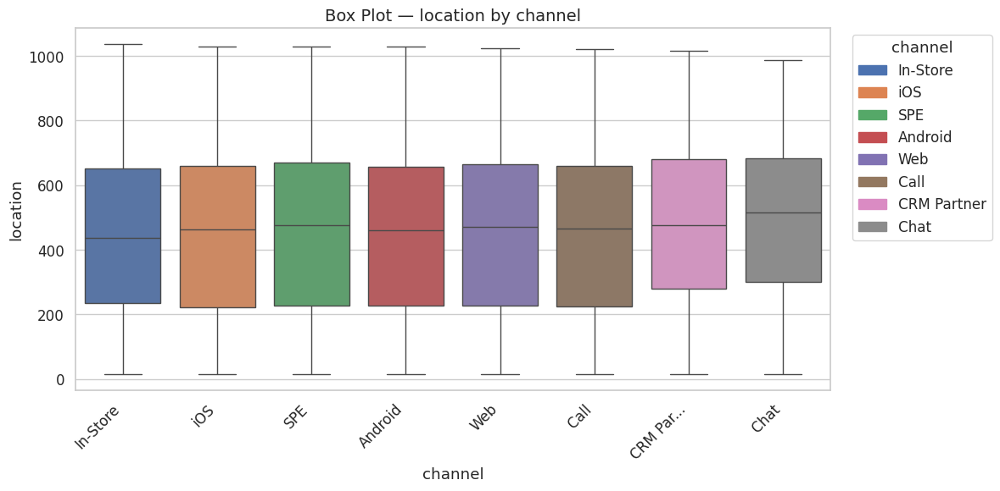


📊 Vẽ biểu đồ cho cặp: (channel, discount)


/tmp/ipykernel_2436351/499568005.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))
/tmp/ipykernel_2436351/499568005.py:59: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  ax = sns.kdeplot(


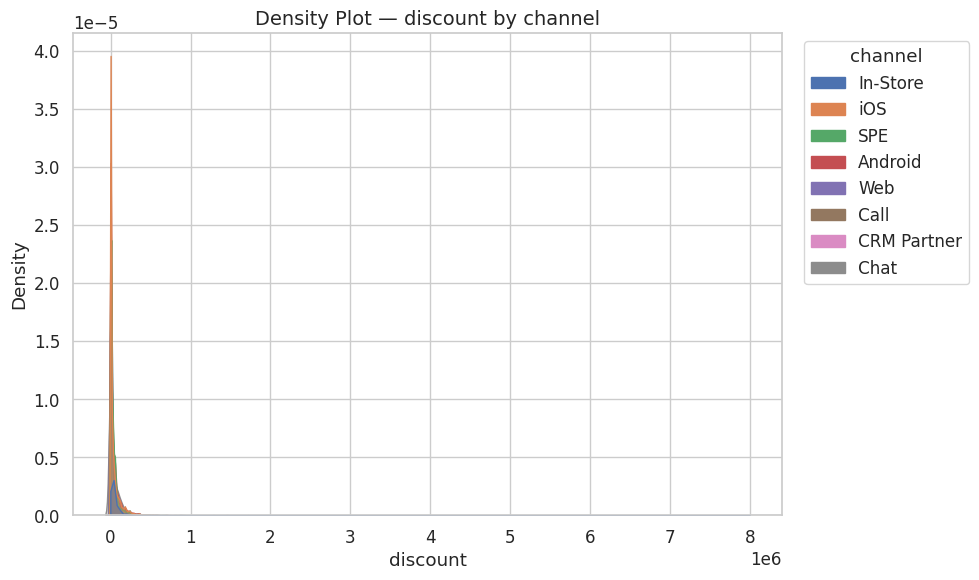

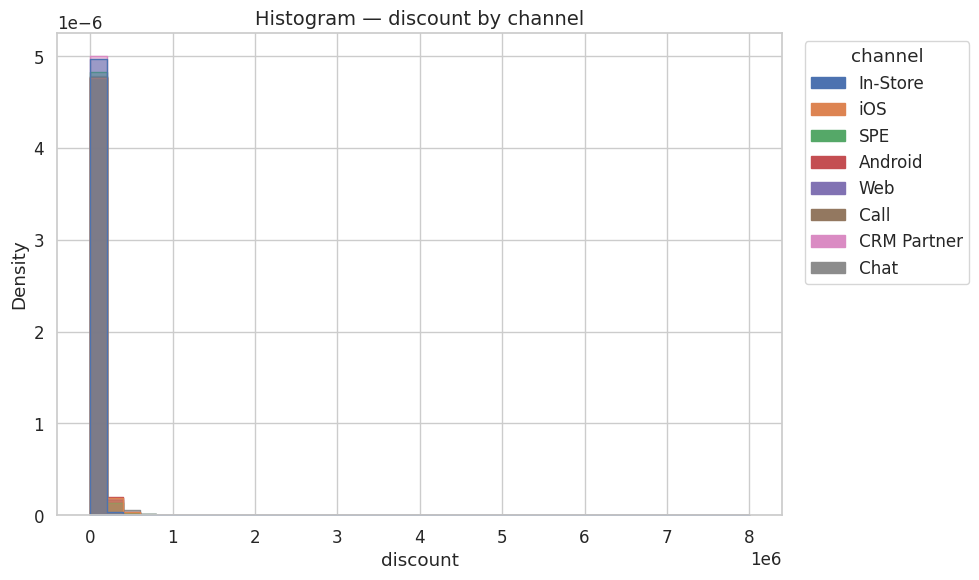

/tmp/ipykernel_2436351/499568005.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


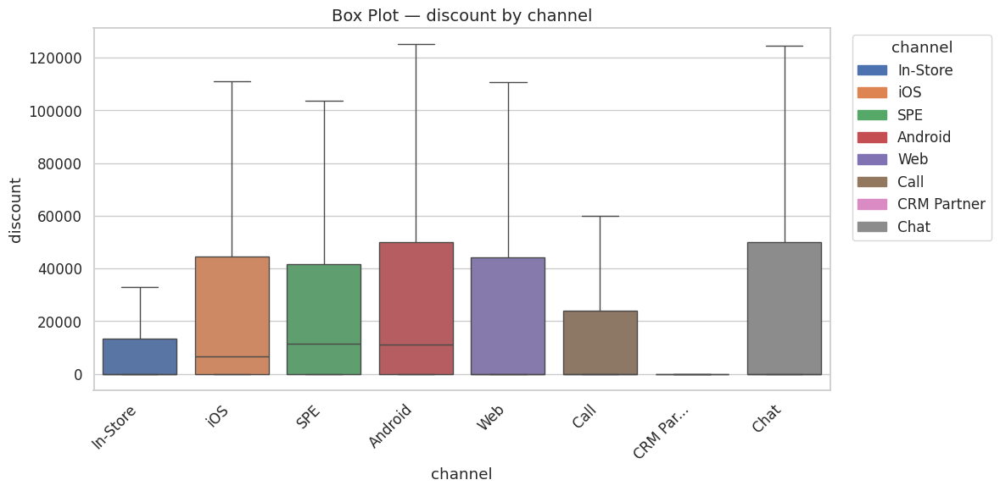


📊 Vẽ biểu đồ cho cặp: (payment, timestamp)


/tmp/ipykernel_2436351/499568005.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


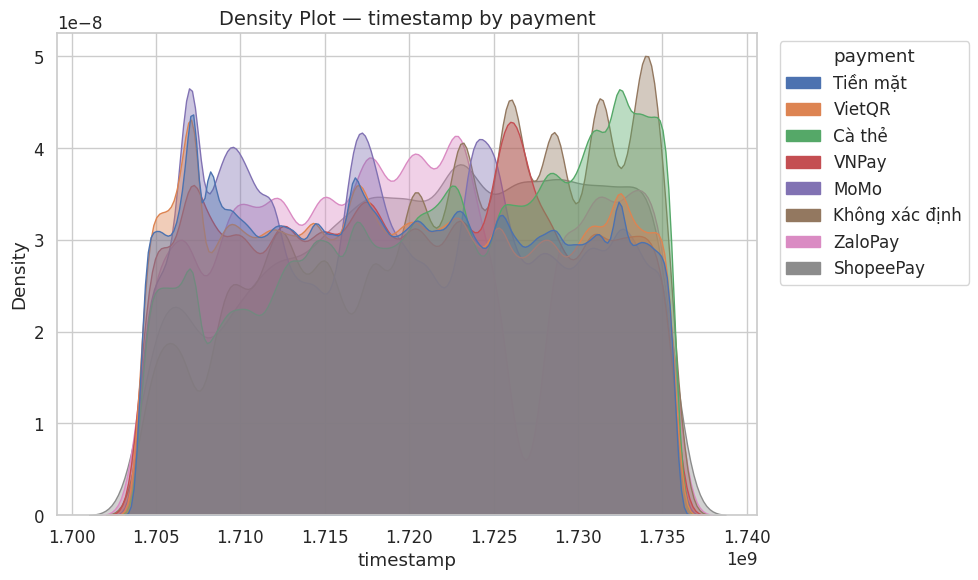

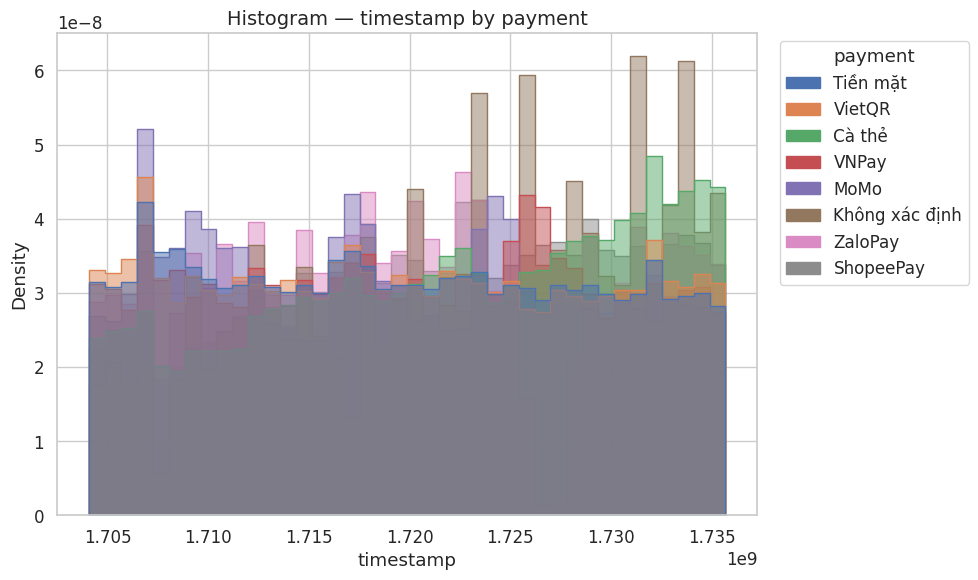

/tmp/ipykernel_2436351/499568005.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


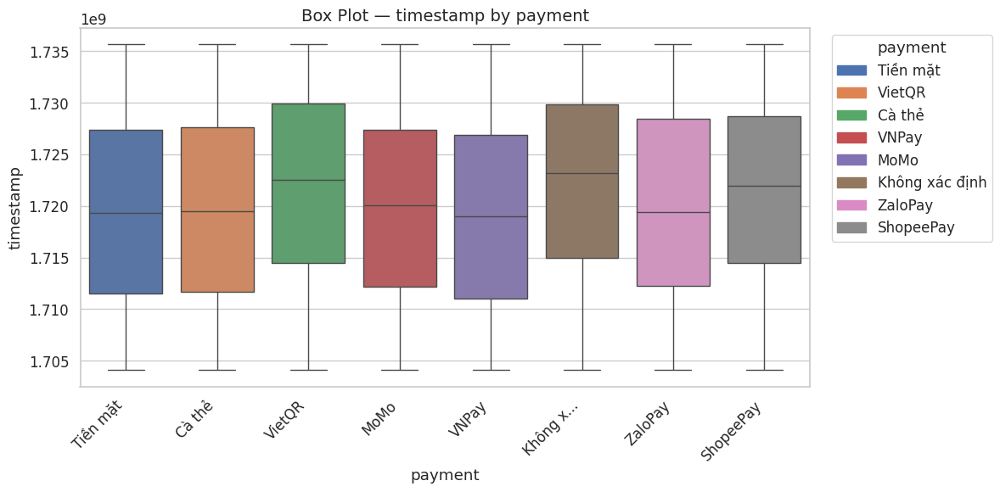


📊 Vẽ biểu đồ cho cặp: (payment, event_value)


/tmp/ipykernel_2436351/499568005.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


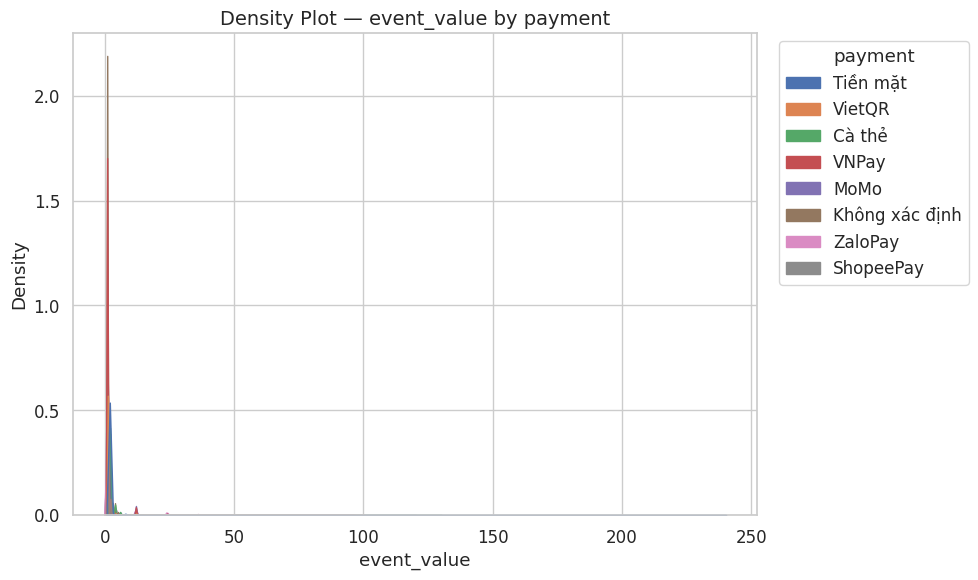

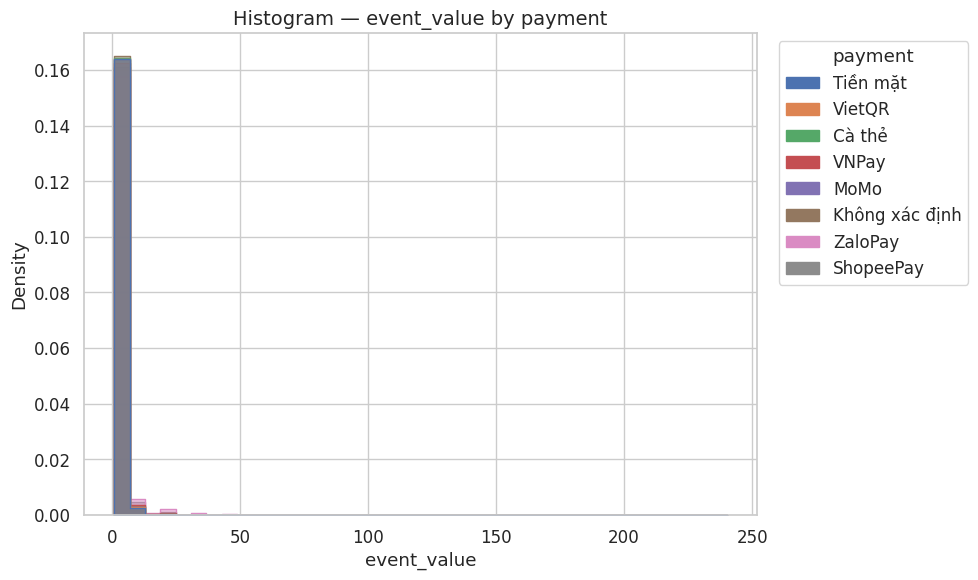

/tmp/ipykernel_2436351/499568005.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


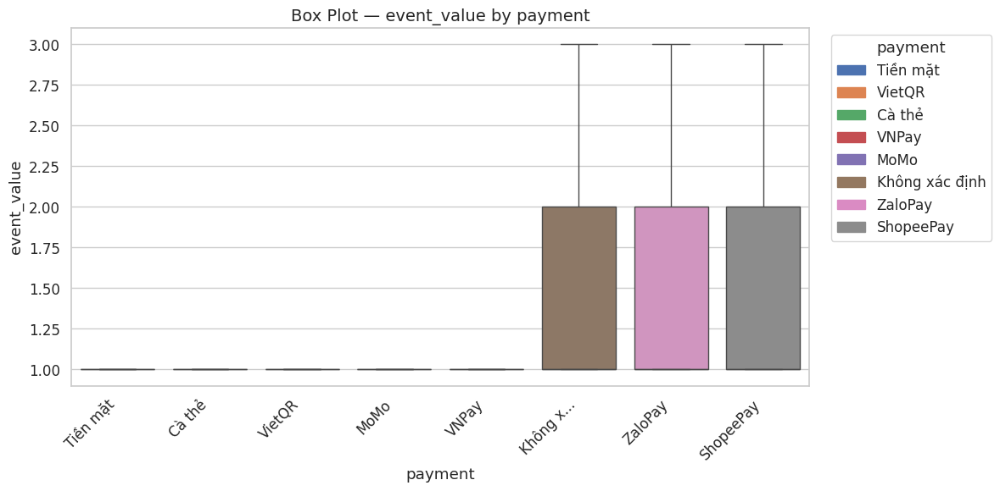


📊 Vẽ biểu đồ cho cặp: (payment, price)


/tmp/ipykernel_2436351/499568005.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


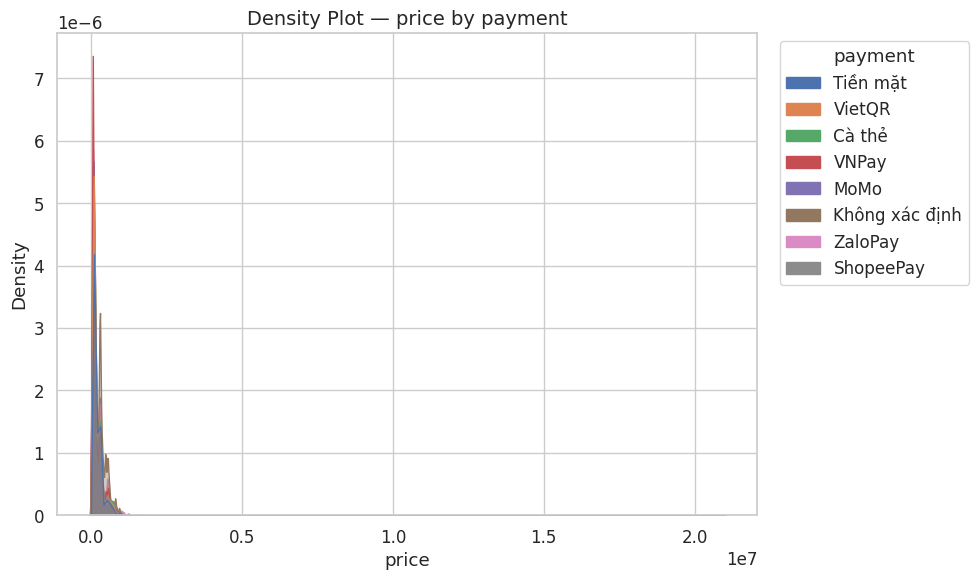

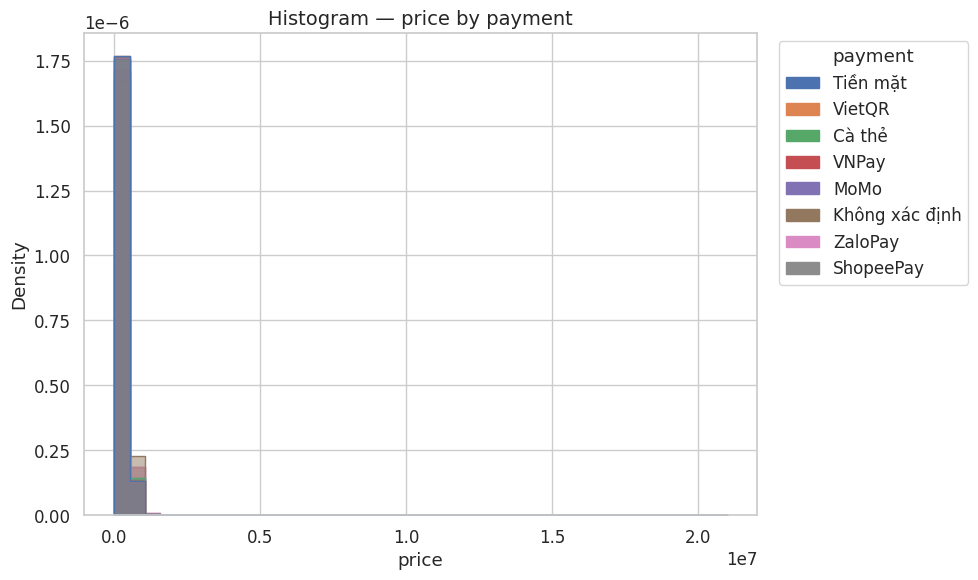

/tmp/ipykernel_2436351/499568005.py:105: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


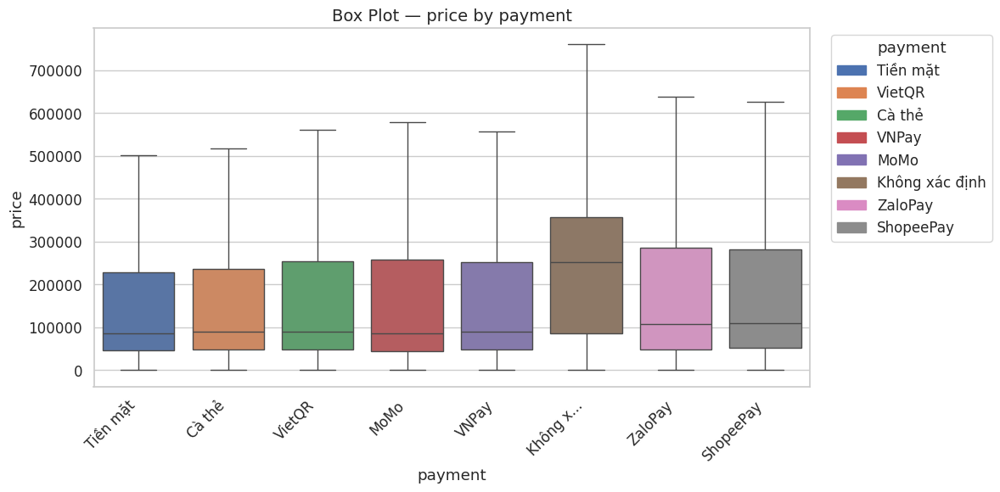


📊 Vẽ biểu đồ cho cặp: (payment, date_key)


/tmp/ipykernel_2436351/499568005.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top[cat_col] = df_top[cat_col].apply(lambda x: truncate_label(x, max_len=10))


In [ ]:
numeric_cols, category_cols = detect_column_types(df_purchase)
category_cols = ['channel', 'payment']

print("🔢 Numeric columns:", numeric_cols)
print("🏷️ Category columns:", category_cols)

# Vẽ cho mọi cặp có dữ liệu
for cat_col in category_cols:
    for num_col in numeric_cols:
        print(f"\n📊 Vẽ biểu đồ cho cặp: ({cat_col}, {num_col})")
        plot_numeric_category(df_purchase, cat_col, num_col)

### Category-Category


📊 Phân tích cặp (item_id, channel)
────────────────────────────
🔹 Bảng tần suất:
channel        Android  Call  Chat  In-Store    SPE   Web    iOS
item_id                                                         
0020010000438     3840   812    31    184495   4058  1312  11959
1512000000004     5074   379    15    254124  26719  1438  14990
2803000000011     1361   204     0    178804      0   359   5082
2803000000013     1580   255     0    215711      0   491   6053
3773000000004     1980   526     7    144548   1599   635   7218
4690000000001     1613    99     2    189611    849   387   5358
5950000000001     1490   316     4    165041   7120   483   5368
6768000000005     2237   357     8    139438   6808   542   7904

🔹 Chi-square = 70835.208, p = 0.0000e+00, dof = 42
➡️ Kết luận: Hai biến có mối liên hệ **có ý nghĩa thống kê**.


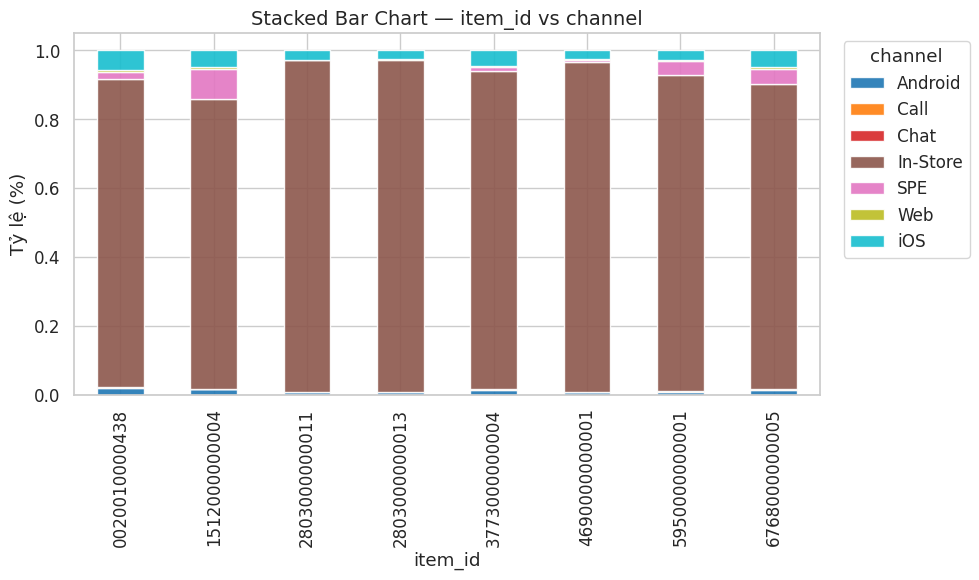

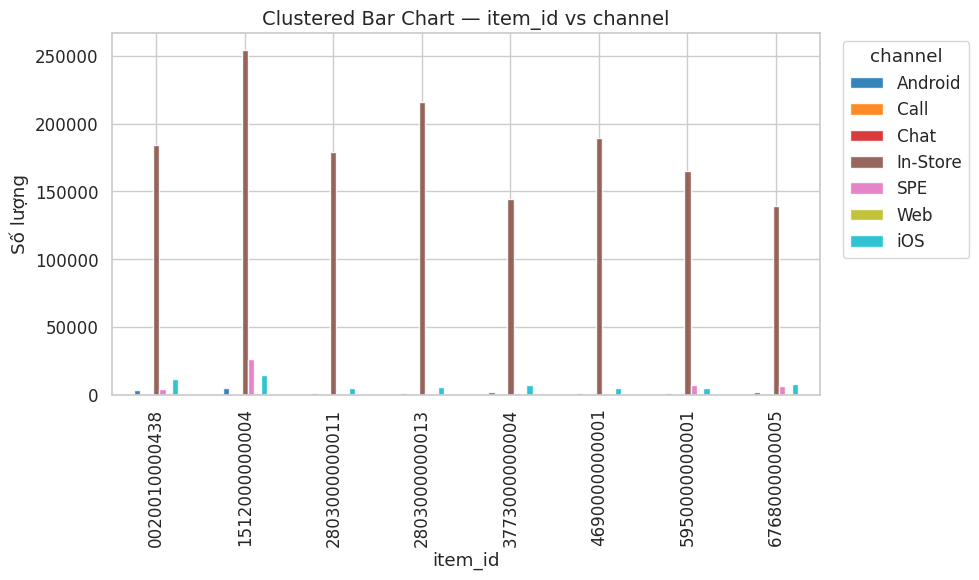


📊 Phân tích cặp (item_id, payment)
────────────────────────────
🔹 Bảng tần suất:
payment        Cà thẻ  Không xác định  MoMo  ShopeePay  Tiền mặt  VNPay  \
item_id                                                                   
0020010000438   23333            2531  5026        369    125723  11244   
1512000000004   32728           15030  6115        418    180330  18661   
2803000000011   21170               0  3432        193    119463  10623   
2803000000013   24389               0  3976        223    144213  13186   
3773000000004   13576             984  2480        226     97725  10177   
4690000000001   20410             486  3760        213    126571   9473   
5950000000001   20253            4194  2723        203    111884  11517   
6768000000005   19507            3907  4081        222     94909   8624   

payment        VietQR  ZaloPay  
item_id                         
0020010000438   36251     1880  
1512000000004   46776     2478  
2803000000011   29875      974  
28

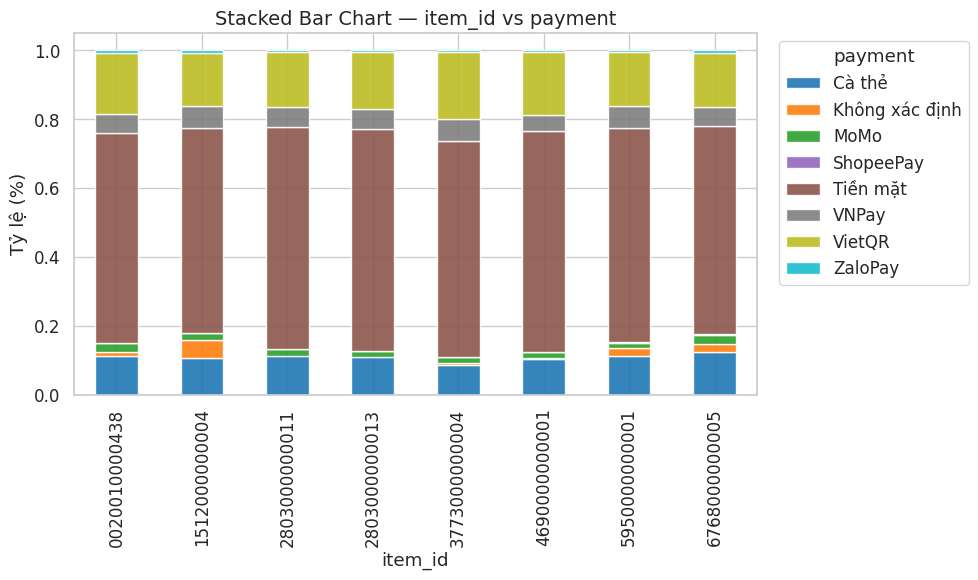

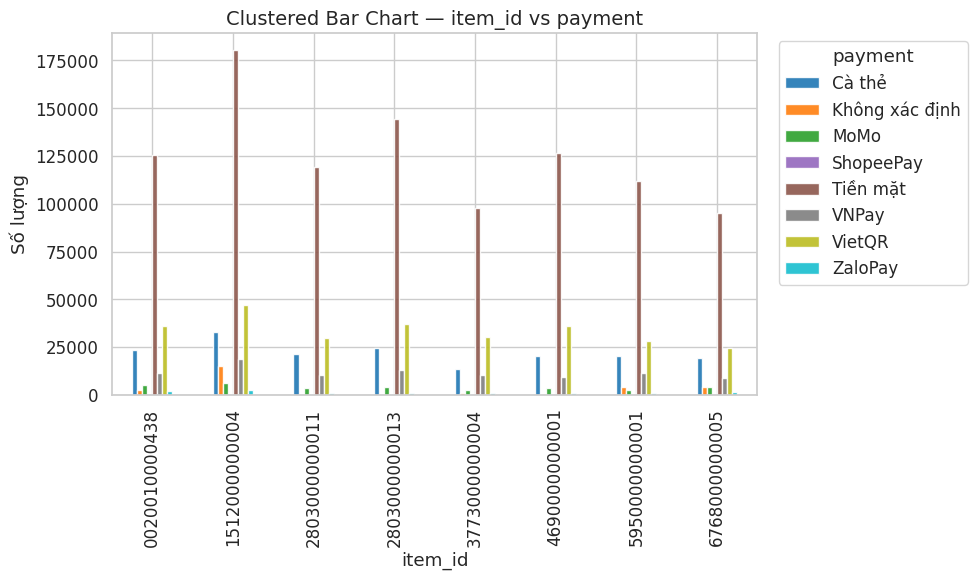


📊 Phân tích cặp (channel, payment)
────────────────────────────
🔹 Bảng tần suất:
payment       Cà thẻ  Không xác định    MoMo  ShopeePay  Tiền mặt    VNPay  \
channel                                                                      
Android        38498               0   51815       6632    325952    11076   
CRM Partner       19               0       0          0     16621        0   
Call             355               0       0          0     63551        0   
Chat               3               0       0          0      2307        0   
In-Store     3852419               0  464852       6844  20881454  2008442   
SPE              865          331950       0          0    270069        0   
Web            16070               0   16241       2134     90577     5495   
iOS           132060               0  215074      29894    803881    55380   

payment       VietQR  ZaloPay  
channel                        
Android         6812    38668  
CRM Partner        0        0  
Call     

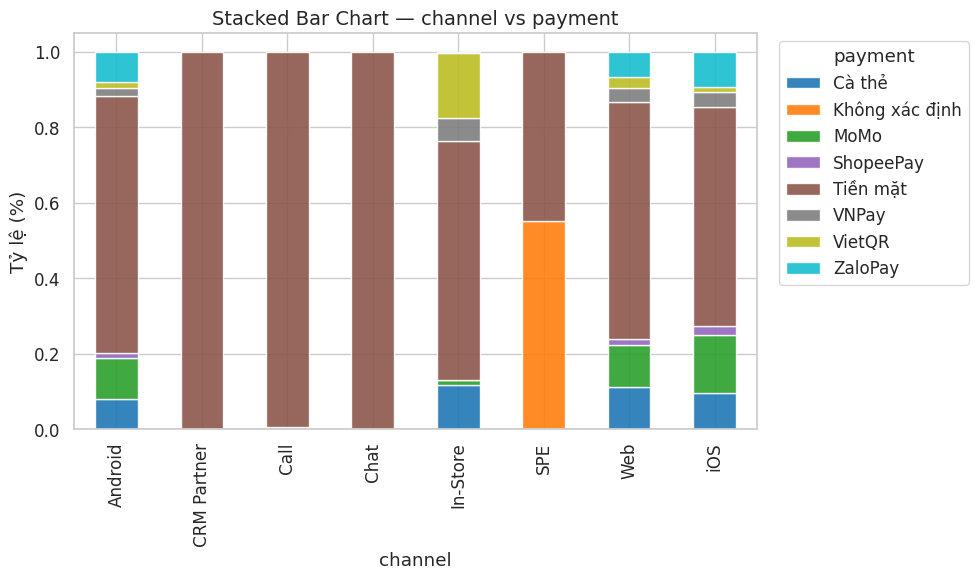

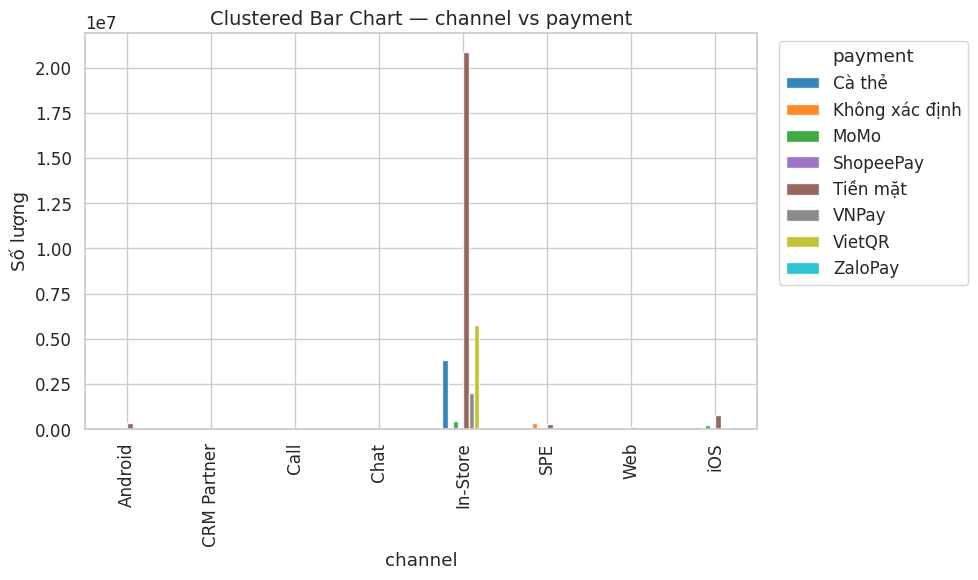

In [15]:
import polars as pl
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

def analyze_category_category(df_item, cat1, cat2, top_k=10):
    """
    Phân tích thống kê & trực quan hóa giữa hai biến categorical:
    - Chi-square test (kiểm định độc lập)
    - Stacked Bar Chart (phân bố theo tỷ lệ)
    - Clustered Bar Chart (so sánh số lượng)
    """

    # --- Chuẩn bị dữ liệu ---
    df_plot = (
        df_item
        .select([cat1, cat2])
        .drop_nulls()
    ).to_pandas()

    if df_plot.empty:
        print(f"[⚠️] Không có dữ liệu hợp lệ cho ({cat1}, {cat2})")
        return

    # Lấy top category phổ biến nhất của mỗi biến
    top_cat1 = df_plot[cat1].value_counts().nlargest(top_k).index
    top_cat2 = df_plot[cat2].value_counts().nlargest(top_k).index
    df_top = df_plot[df_plot[cat1].isin(top_cat1) & df_plot[cat2].isin(top_cat2)]

    # --- 1️⃣ Thống kê: Cross-tab + Chi-square test ---
    crosstab = pd.crosstab(df_top[cat1], df_top[cat2])
    chi2, p, dof, expected = chi2_contingency(crosstab)

    print(f"\n📊 Phân tích cặp ({cat1}, {cat2})")
    print("────────────────────────────")
    print("🔹 Bảng tần suất:")
    print(crosstab)
    print(f"\n🔹 Chi-square = {chi2:.3f}, p = {p:.4e}, dof = {dof}")
    if p < 0.05:
        print("➡️ Kết luận: Hai biến có mối liên hệ **có ý nghĩa thống kê**.")
    else:
        print("➡️ Kết luận: Không tìm thấy mối liên hệ đáng kể.")

    # --- 2️⃣ Visualization ---

    sns.set(style="whitegrid", font_scale=1.1)
    palette = sns.color_palette("tab10", n_colors=len(top_cat2))

    # ==============================
    # 🔹 STACKED BAR CHART
    # ==============================
    crosstab_ratio = crosstab.div(crosstab.sum(axis=1), axis=0)

    crosstab_ratio.plot(
        kind="bar",
        stacked=True,
        figsize=(10, 6),
        colormap="tab10",
        alpha=0.9
    )
    plt.title(f"Stacked Bar Chart — {cat1} vs {cat2}", fontsize=14)
    plt.xlabel(cat1)
    plt.ylabel("Tỷ lệ (%)")
    plt.legend(title=cat2, bbox_to_anchor=(1.02, 1), loc="upper left", frameon=True)
    plt.tight_layout()
    plt.show()

    # ==============================
    # 🔹 CLUSTERED BAR CHART
    # ==============================
    crosstab.plot(
        kind="bar",
        figsize=(10, 6),
        colormap="tab10",
        alpha=0.9
    )
    plt.title(f"Clustered Bar Chart — {cat1} vs {cat2}", fontsize=14)
    plt.xlabel(cat1)
    plt.ylabel("Số lượng")
    plt.legend(title=cat2, bbox_to_anchor=(1.02, 1), loc="upper left", frameon=True)
    plt.tight_layout()
    plt.show()


for i, cat1 in enumerate(category_cols):
    for cat2 in category_cols[i+1:]:
        analyze_category_category(df_purchase, cat1, cat2, top_k=8)
